## Prevedi le vendite di un e-commerce con il Deep Learning

Vincenzo Maritati - AI Researcher
www.frankhood.it - www.datamasters.it
      

In [1]:
import os
os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
os.environ["CUDA_VISIBLE_DEVICES"] = '0'
import pickle
import seaborn as sns
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from workalendar.europe import Italy
from workalendar.usa import California

import tensorflow.keras.backend
import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.python.keras.callbacks import Callback
from tensorflow.keras import mixed_precision

mixed_precision.set_global_policy('mixed_float16')
K.set_floatx('float16')
K.set_epsilon(1e-9)

# configurazione per far ignorare le divisioni per 0
np.seterr(divide='ignore', invalid='ignore')

import locale

locale.setlocale(locale.LC_ALL, '')

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3080 Laptop GPU, compute capability 8.6


'Italian_Italy.1252'

In [2]:
percorso_base = 'data/'

## Preparazione del DataSet

### Carichiamo il DataSet

In [3]:
df = pd.read_csv(f'{percorso_base}data.csv',
                 parse_dates=["date"],
                 index_col='date')

df = df.astype(int)

### Studiamo il DataSet

In [4]:
df.head(5)

,smartphone,abbigliamento,libri,cosmetici,scarpe,notebook,borse,cancelleria,giardinaggio,cucina
date,,,,,,,,,,
2016-01-01,60,30,33,12,6,34,23,25,75,59
2016-01-02,45,38,27,27,14,36,21,19,71,50
2016-01-03,51,37,7,23,15,37,16,28,72,49
2016-01-04,57,39,16,20,19,37,21,15,69,42
2016-01-05,71,44,25,24,9,41,7,28,70,57


In [5]:
print("Shape di df:", df.shape)

Shape di df: (2000, 10)


### Controlliamo la presenza di valori NaN nel DataSet

In [6]:
for colonna in df.columns:
    print('Ci sono dei NaN in', colonna, '?', 'Si' if df[colonna].isnull().values.any() else 'No')

Ci sono dei NaN in smartphone ? No
Ci sono dei NaN in abbigliamento ? No
Ci sono dei NaN in libri ? No
Ci sono dei NaN in cosmetici ? No
Ci sono dei NaN in scarpe ? No
Ci sono dei NaN in notebook ? No
Ci sono dei NaN in borse ? No
Ci sono dei NaN in cancelleria ? No
Ci sono dei NaN in giardinaggio ? No
Ci sono dei NaN in cucina ? No


### Stampiamo le informazioni sul dataset

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2000 entries, 2016-01-01 to 2021-06-22
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   smartphone     2000 non-null   int32
 1   abbigliamento  2000 non-null   int32
 2   libri          2000 non-null   int32
 3   cosmetici      2000 non-null   int32
 4   scarpe         2000 non-null   int32
 5   notebook       2000 non-null   int32
 6   borse          2000 non-null   int32
 7   cancelleria    2000 non-null   int32
 8   giardinaggio   2000 non-null   int32
 9   cucina         2000 non-null   int32
dtypes: int32(10)
memory usage: 93.8 KB


In [8]:
df.dtypes

smartphone       int32
abbigliamento    int32
libri            int32
cosmetici        int32
scarpe           int32
notebook         int32
borse            int32
cancelleria      int32
giardinaggio     int32
cucina           int32
dtype: object

### Riordiniamo il dataset in una forma più comoda per la generazione di grafici

In [9]:
df_grafici = df.reset_index().melt(id_vars=["date"],
                                   var_name="category",
                                   value_name="quantity")


df_grafici['day']=df_grafici.date.dt.day
df_grafici['year']=df_grafici.date.dt.strftime('%Y')
df_grafici['month_number']=df_grafici.date.dt.month
df_grafici['month']=df_grafici.date.dt.strftime('%B')
df_grafici['weekday']=df_grafici.date.dt.strftime('%A')
df_grafici['weekday_number']=df_grafici.date.dt.weekday

In [10]:
df_grafici.sort_values('date').head(15)

,date,category,quantity,day,year,month_number,month,weekday,weekday_number
0,2016-01-01,smartphone,60,1,2016,1,gennaio,venerdì,4
2000,2016-01-01,abbigliamento,30,1,2016,1,gennaio,venerdì,4
12000,2016-01-01,borse,23,1,2016,1,gennaio,venerdì,4
18000,2016-01-01,cucina,59,1,2016,1,gennaio,venerdì,4
6000,2016-01-01,cosmetici,12,1,2016,1,gennaio,venerdì,4
14000,2016-01-01,cancelleria,25,1,2016,1,gennaio,venerdì,4
8000,2016-01-01,scarpe,6,1,2016,1,gennaio,venerdì,4
4000,2016-01-01,libri,33,1,2016,1,gennaio,venerdì,4
10000,2016-01-01,notebook,34,1,2016,1,gennaio,venerdì,4
16000,2016-01-01,giardinaggio,75,1,2016,1,gennaio,venerdì,4


### Quali sono le vendite globali dello store?

In [11]:
df_grafici_sum = df_grafici.groupby('date').sum()
df_grafici_sum['day']=df_grafici_sum.index.day
df_grafici_sum['weekday']=df_grafici_sum.index.strftime('%A')
df_grafici_sum['year']=df_grafici_sum.index.strftime('%Y')
df_grafici_sum['month']=df_grafici_sum.index.month

<Figure size 1008x432 with 0 Axes>

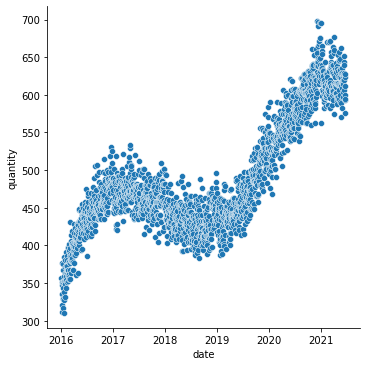

In [12]:
plt.figure(figsize=(14, 6))
sns.relplot(x="date", y="quantity", data=df_grafici_sum,hue_order=['festivi','prefestivi','nessuna_festivita'])
plt.show()

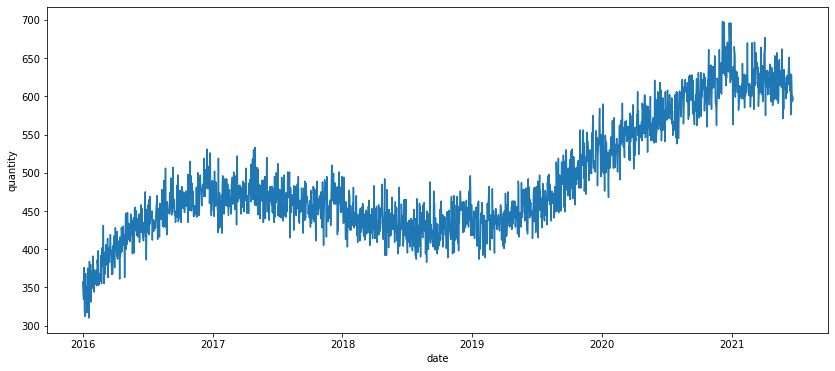

In [13]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_grafici_sum, x="date", y="quantity")
plt.show()


### Come vende lo store nei vari giorni della settimana?

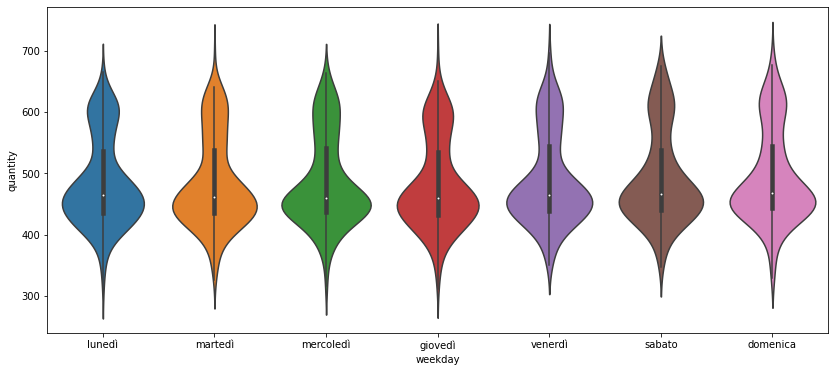

In [14]:
plt.figure(figsize=(14, 6))
sns.violinplot(x="weekday", y="quantity", data=df_grafici_sum.sort_values('weekday_number'))
plt.show()

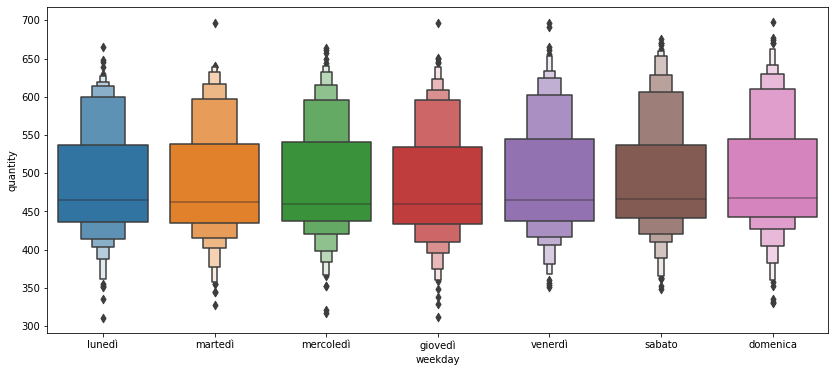

In [15]:
plt.figure(figsize=(14, 6))
sns.boxenplot(x="weekday", y="quantity", data=df_grafici_sum.sort_values('weekday_number'))
plt.show()

### Come vende lo store nei vari giorni del mese e come?

<Figure size 1008x432 with 0 Axes>

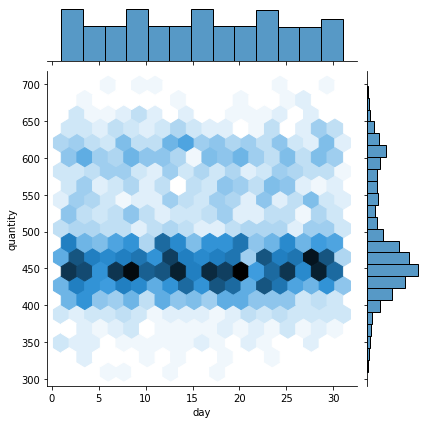

In [16]:
plt.figure(figsize=(14, 6))
sns.jointplot(x="day", y="quantity", kind="hex", data=df_grafici_sum)
plt.show()



### Confrontiamo i vari anni tra di loro?


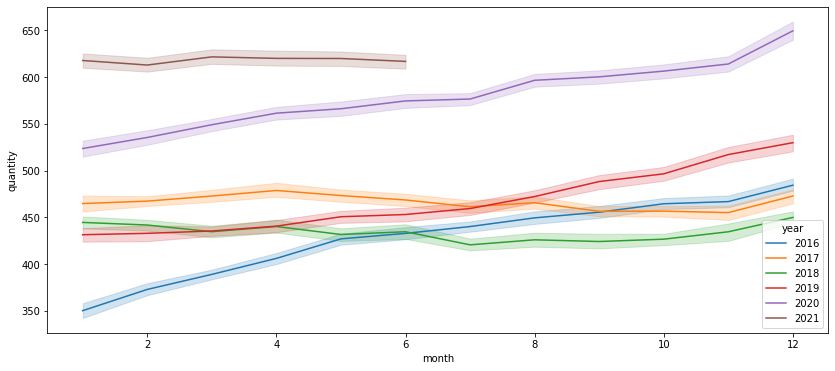

In [17]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_grafici_sum, x="month",hue='year', y="quantity")
plt.show()


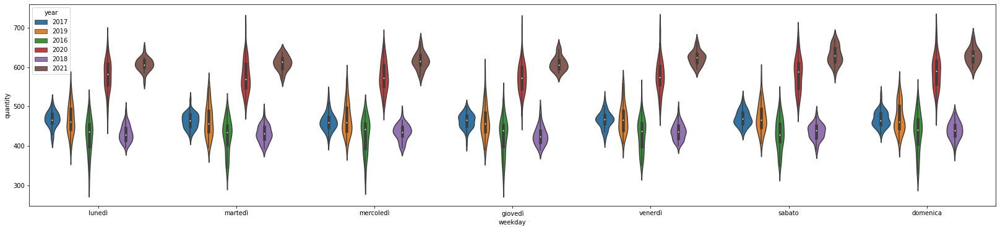

In [18]:
plt.figure(figsize=(28, 6))
sns.violinplot(x="weekday", y="quantity",hue='year', data=df_grafici_sum.sort_values('weekday_number'))
plt.show()

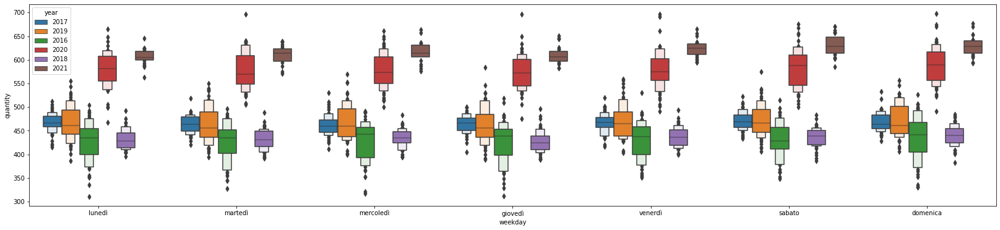

In [19]:
plt.figure(figsize=(28, 6))
sns.boxenplot(x="weekday", y="quantity",hue='year', data=df_grafici_sum.sort_values('weekday_number'))
plt.show()

<Figure size 1008x432 with 0 Axes>

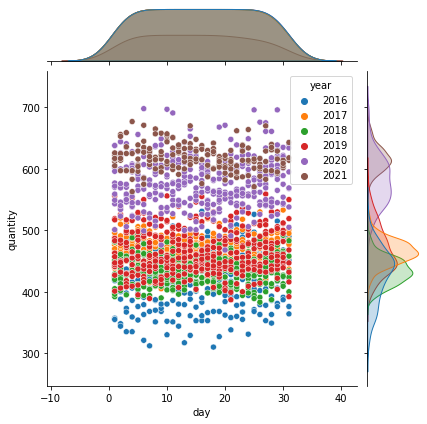

In [20]:
plt.figure(figsize=(14, 6))
sns.jointplot(x="day", y="quantity",hue='year', data=df_grafici_sum)
plt.show()


### Quali sono le categorie che vendono di più?

In [21]:
categorie_più_vendute = df_grafici.groupby('category')['quantity'].agg('sum').reset_index().sort_values(
    'quantity',
    ascending=False
)

categorie_più_vendute

,category,quantity
0,abbigliamento,132389
2,cancelleria,124884
9,smartphone,123998
4,cucina,123368
6,libri,111888
5,giardinaggio,103728
3,cosmetici,90997
8,scarpe,58087
7,notebook,57387
1,borse,48264


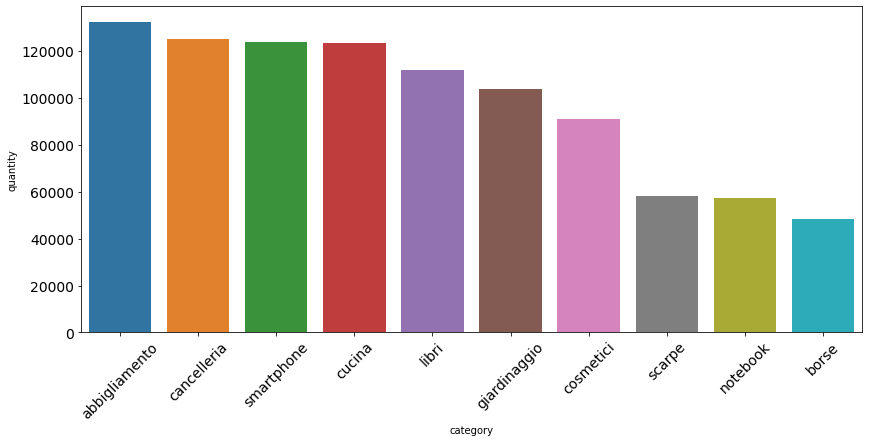

In [22]:
plt.figure(figsize=(14, 6))
sns.barplot(x='category', y='quantity', data=categorie_più_vendute, palette="tab10")
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

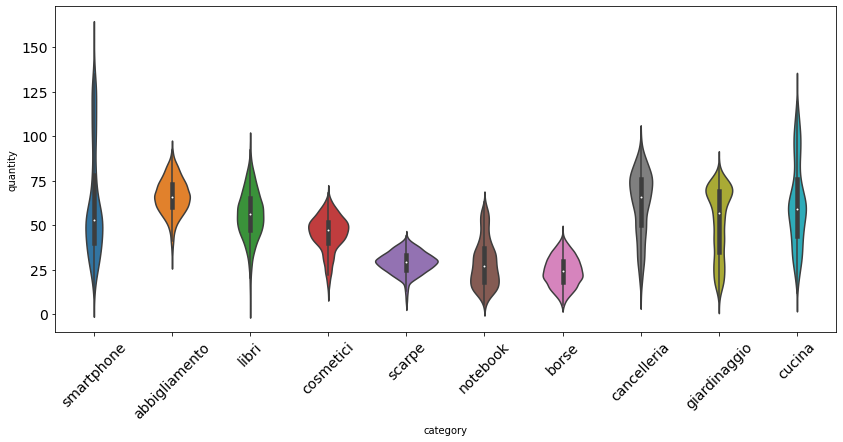

In [23]:
plt.figure(figsize=(14, 6))
sns.violinplot(x="category", y="quantity", data=df_grafici)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

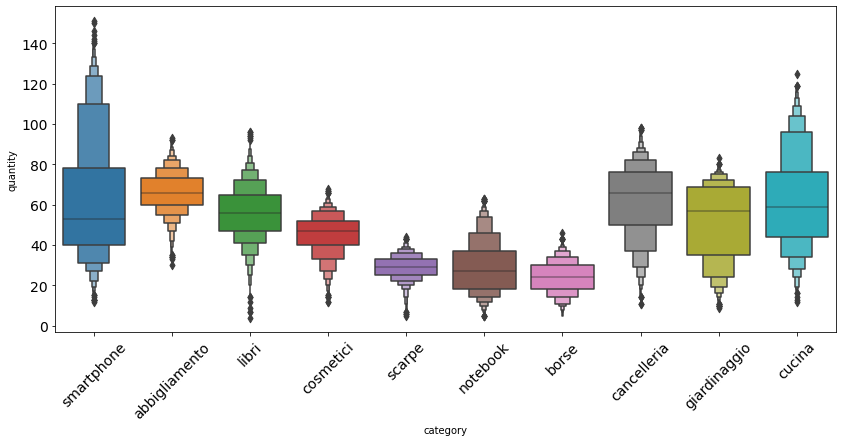

In [24]:
plt.figure(figsize=(14, 6))
sns.boxenplot(x="category", y="quantity", data=df_grafici)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

<Figure size 1440x1440 with 0 Axes>

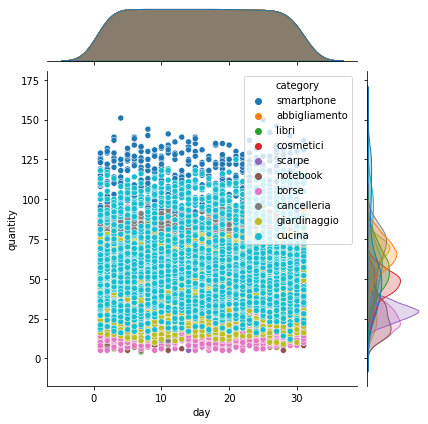

In [25]:
plt.figure(figsize=(20, 20))
sns.jointplot(x="day", y="quantity",hue='category', data=df_grafici)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### Visualizziamo le vendite giorno per giorno delle varie categorie

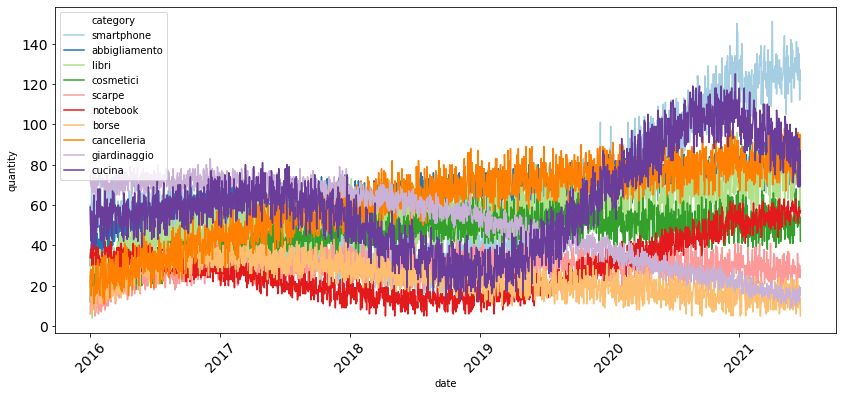

In [26]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_grafici, x="date", y="quantity", hue="category", palette='Paired')
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### Visualizziamo le vendite giorno per giorno delle varie categorie per un mese
Abbiamo scelto come mese campione maggio 2019

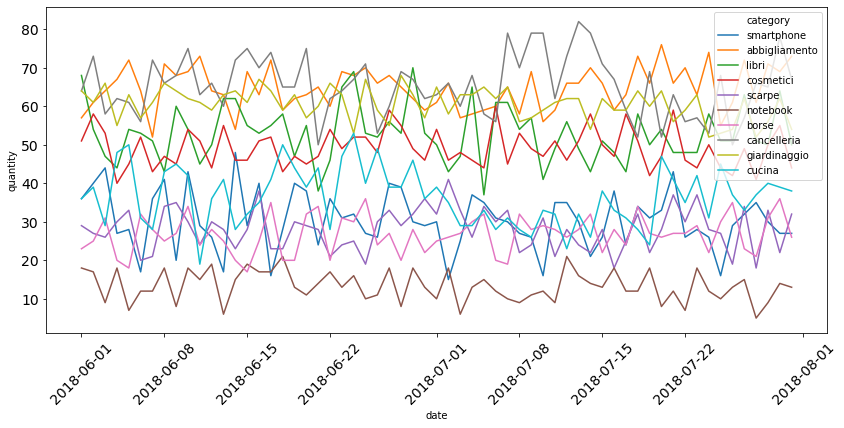

In [27]:
plt.figure(figsize=(14, 6))
sns.lineplot(
    data=df_grafici[(df_grafici.date.dt.year == 2018) & (df_grafici.date.dt.month > 5) & (df_grafici.date.dt.month < 8)],
    x="date",
    y="quantity",
    hue="category"
)

plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### In quale mese vendiamo di più?

In [28]:
mesi_migliori = df_grafici.groupby(['month','month_number'])['quantity'].sum().reset_index().sort_values('month_number')
mesi_migliori[['month',	'quantity']]

,month,quantity
4,gennaio,87793
3,febbraio,81072
8,marzo,89968
1,aprile,88401
7,maggio,92016
5,giugno,84466
6,luglio,73092
0,agosto,74698
11,settembre,72732
10,ottobre,75965


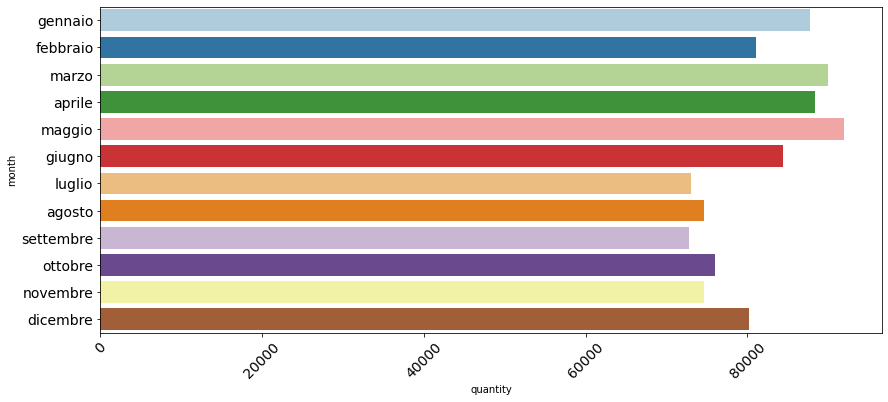

In [29]:
plt.figure(figsize=(14, 6))
sns.barplot(y='month', x='quantity', data=mesi_migliori, palette="Paired", orientation='horizontal')
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### In quale giorno della settimana vendiamo di più?

In [30]:
giorni_migliori = df_grafici.groupby(['weekday','weekday_number'])['quantity'].sum().reset_index().sort_values('weekday_number')
giorni_migliori

,weekday,weekday_number,quantity
2,lunedì,0,138917
3,martedì,1,138501
4,mercoledì,2,138489
1,giovedì,3,137484
6,venerdì,4,139844
5,sabato,5,140642
0,domenica,6,141113


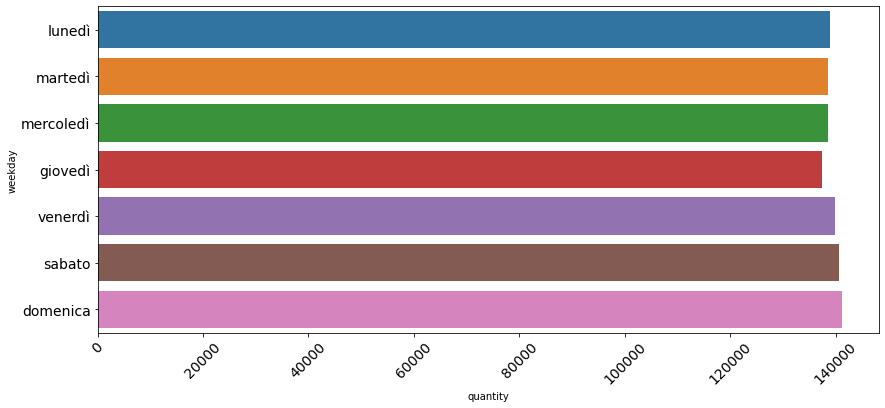

In [31]:
plt.figure(figsize=(14, 6))
sns.barplot(y='weekday', x='quantity', data=giorni_migliori, palette="tab10", orientation='horizontal')
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### In quale anno abbiamo venduto di più?

In [32]:
anni_migliori = df_grafici.groupby(df_grafici['date'].dt.strftime('%Y'))['quantity'].sum().reset_index().sort_values('date')
anni_migliori

,date,quantity
0,2016,156792
1,2017,170122
2,2018,158421
3,2019,170619
4,2020,212093
5,2021,106943


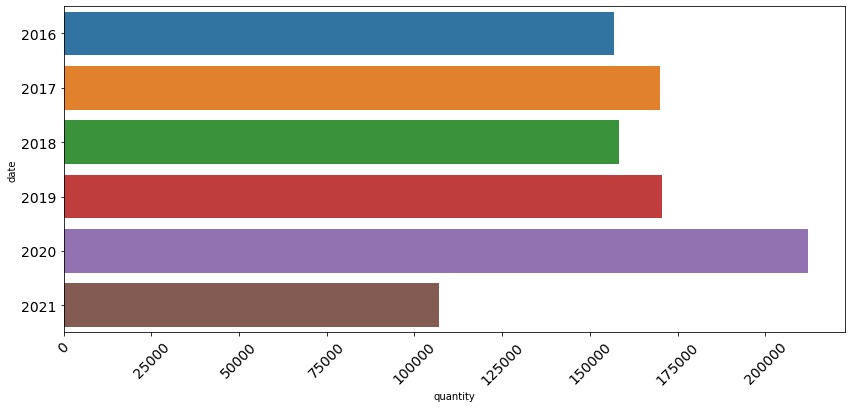

In [33]:
plt.figure(figsize=(14, 6))
sns.barplot(y='date', x='quantity', data=anni_migliori, palette="tab10", orientation='horizontal')
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()


### Visualizziamo i grafici per le singole categorie

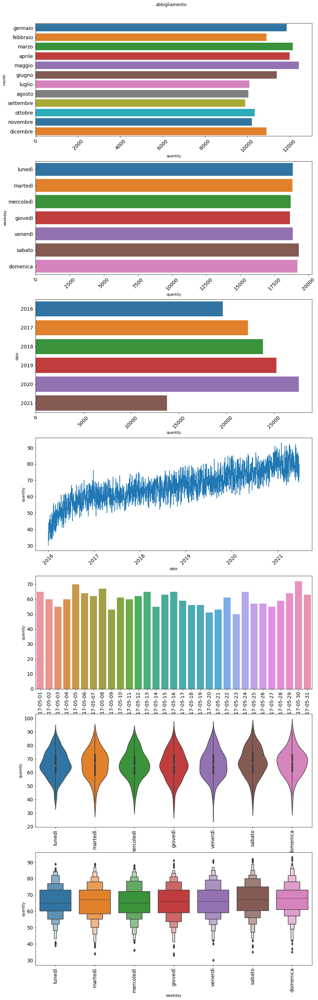

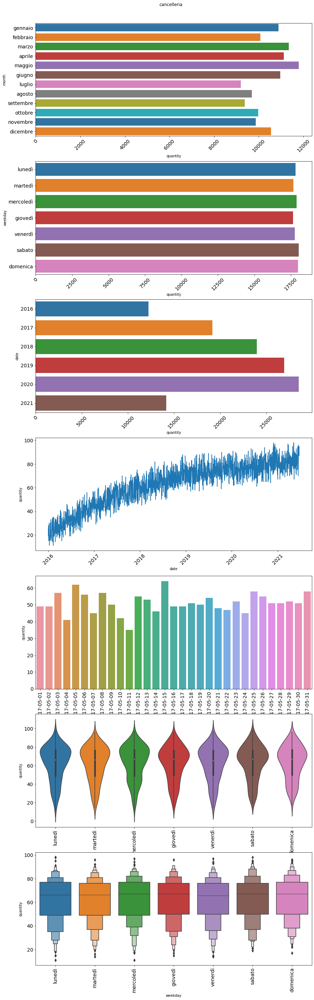

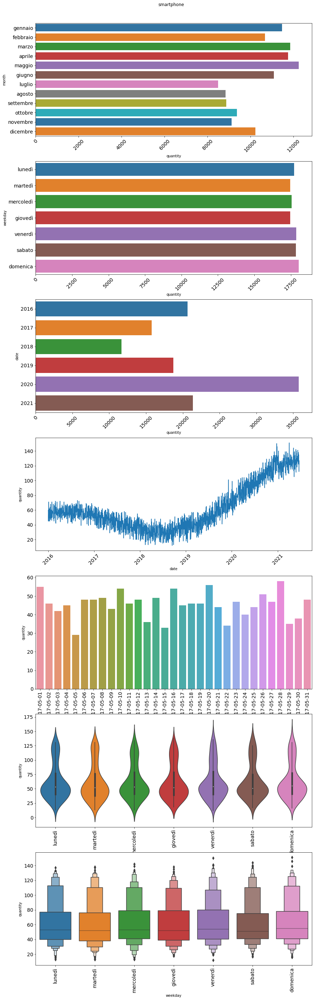

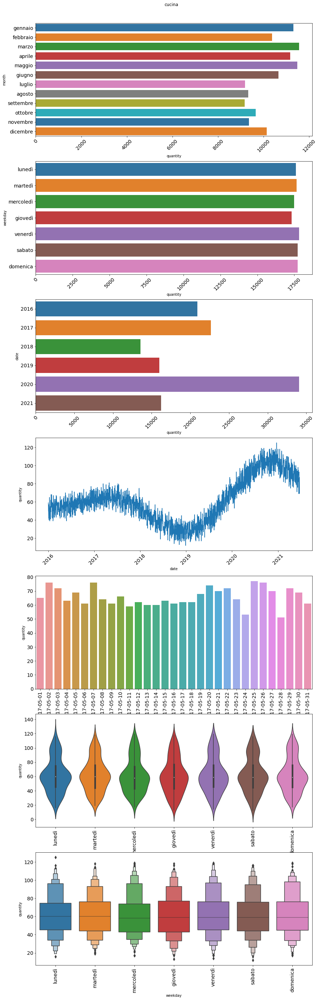

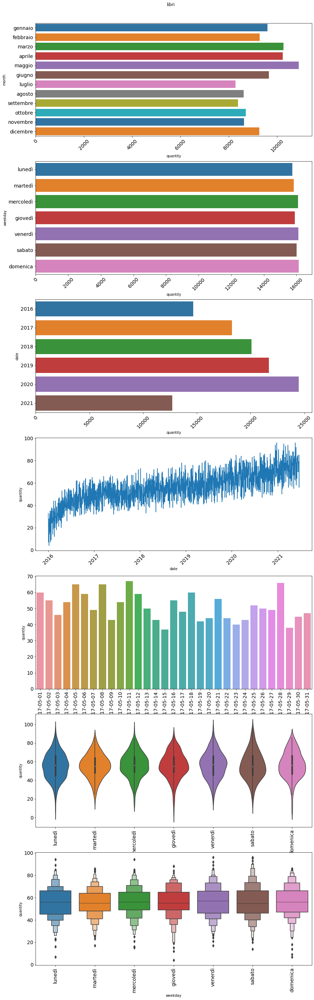

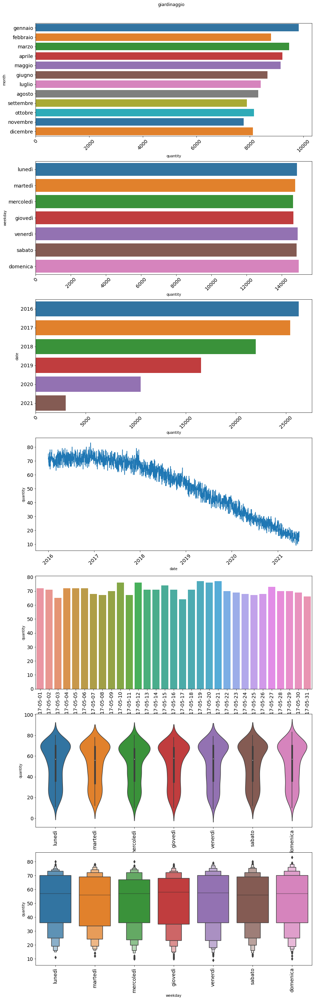

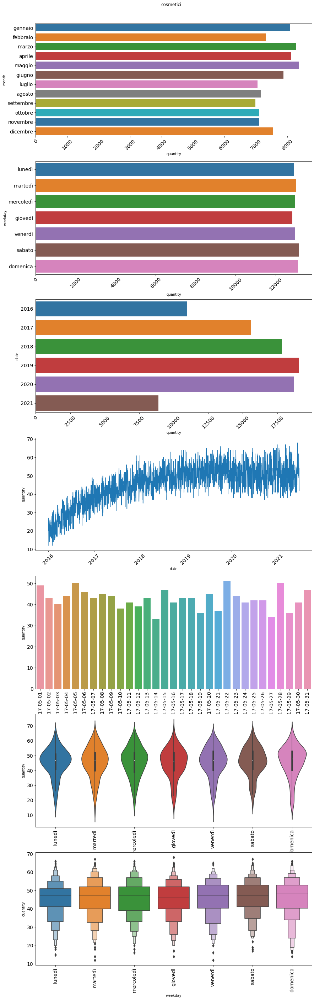

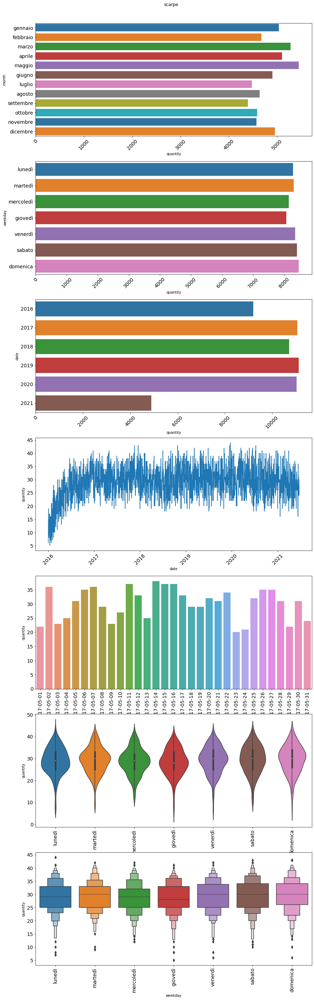

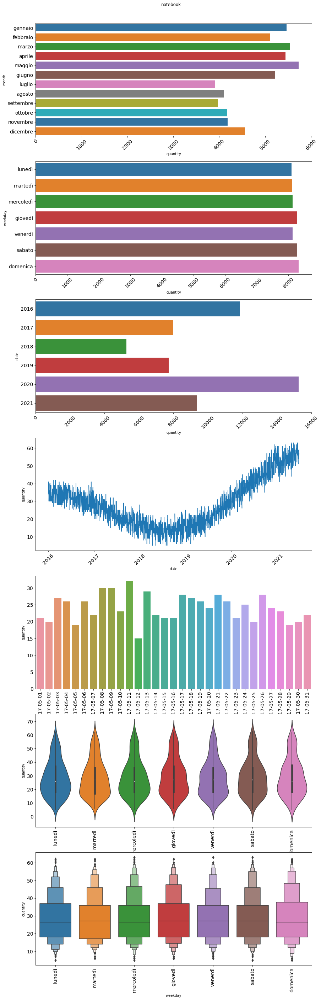

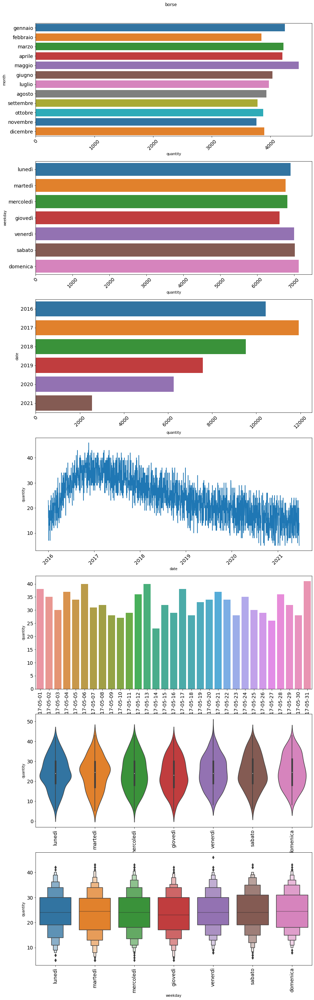

In [34]:
for categoria in categorie_più_vendute.category:
    df_categoria = df_grafici[df_grafici.category == categoria]

    fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(nrows=7, ncols=1, figsize=(14, 40))
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=5)
    fig.suptitle(f'{categoria}')
    fig.subplots_adjust(top=0.96)


    mesi_migliori = df_categoria.groupby(['month','month_number'])['quantity'].sum().reset_index().sort_values('month_number')

    sns.barplot(y='month', x='quantity', data=mesi_migliori, palette="tab10", orientation='horizontal', ax=ax1)
    ax1.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)

    giorni_migliori = df_categoria.groupby(['weekday','weekday_number'])['quantity'].sum().reset_index().sort_values('weekday_number')

    sns.barplot(y='weekday', x='quantity', data=giorni_migliori, palette="tab10", orientation='horizontal', ax=ax2)
    ax2.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax2.tick_params(axis='y', labelsize=14)

    anni_migliori = df_categoria.groupby(df_categoria['date'].dt.strftime('%Y'))['quantity'].sum().reset_index().sort_values('date')

    sns.barplot(y='date', x='quantity', data=anni_migliori, palette="tab10", orientation='horizontal', ax=ax3)
    ax3.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax3.tick_params(axis='y', labelsize=14)

    sns.lineplot(data=df_categoria, x="date", y="quantity", ax=ax4)
    ax4.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax4.tick_params(axis='y', labelsize=14)

    df_categoria_singolo_mese = df_categoria[(df_categoria.date.dt.year == 2017) & (df_categoria.date.dt.month == 5)].copy()
    df_categoria_singolo_mese.date = df_categoria_singolo_mese.date.dt.date
    sns.barplot(data=df_categoria_singolo_mese, x="date", y="quantity", ax=ax5)
    ax5.tick_params(axis='x', labelrotation=90, labelsize=14)
    ax5.tick_params(axis='y', labelsize=14)






    sns.violinplot(x="weekday", y="quantity", data=df_categoria.sort_values('weekday_number'), ax=ax6)
    ax6.tick_params(axis='x', labelrotation=90, labelsize=14)
    ax6.tick_params(axis='y', labelsize=14)


    sns.boxenplot(x="weekday", y="quantity", data=df_categoria.sort_values('weekday_number'), ax=ax7)
    ax7.tick_params(axis='x', labelrotation=90, labelsize=14)
    ax7.tick_params(axis='y', labelsize=14)

    # sns.jointplot(x="day", y="quantity", kind="hex", data=df_categoria, ax=ax8)
    # ax8.tick_params(axis='x', labelrotation=90, labelsize=14)
    # ax8.tick_params(axis='y', labelsize=14)



    plt.show()

    print('\n\n\n\n')

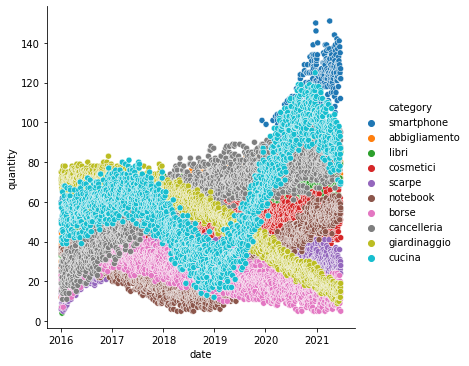

In [35]:

sns.relplot(x="date", y="quantity", hue="category", data=df_grafici);

### Controlliamo la correlazione

<AxesSubplot:>

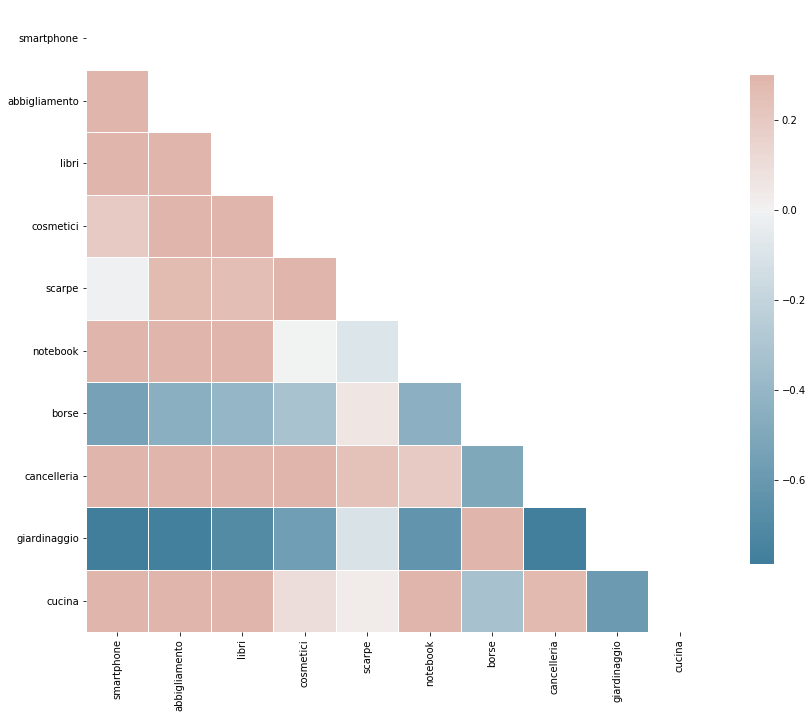

In [36]:
# Compute the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(14, 18))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})


### Controlliamo che non ci siano date mancanti nel nostro dataset

In [37]:
inizio = min(df.index)
fine = max(df.index)
intervallo_di_date = pd.date_range(inizio, fine, freq='D').tolist()

In [38]:
set_date_in_df = set(df.index.to_list())
set_intervallo_di_date = set(intervallo_di_date)
check = all(item in set_intervallo_di_date for item in set_date_in_df)

print('ci sono tutte le date nel dataset?', 'Si' if check else 'No')
print('le date presenti nel dataset sono uniche?', 'Si' if df.index.is_unique else 'No')

ci sono tutte le date nel dataset? Si
le date presenti nel dataset sono uniche? Si


## Arricchimento dataset

### Aggiungiamo le festività al dataset

In [39]:
calendario = Italy()
calendario_usa = California()
festivita = []
black_friday = []
anni = df.index.year.unique().to_list()
anni.sort()
for anno in anni:
    for holiday in calendario.holidays(anno):
        festivita.append(holiday[0])

    for holiday in calendario_usa.holidays(anno):
        if holiday[1] == 'Thanksgiving Friday':
            festivita.append(holiday[0])
            black_friday.append(holiday[0])

df['holidays'] = False
df.loc[df.index.isin(festivita), 'holidays'] = True


## Aggiungiamo i prefestivi al dataset

In [40]:
df['pre_holidays'] = df['holidays'].shift(-1)
df.dropna(inplace=True)



### Controlliamo che tutto sia corretto

In [41]:
print(df.loc[(df.index.day == 24) & (df.index.month == 12), ['holidays', 'pre_holidays']])

            holidays pre_holidays
date                             
2016-12-24     False         True
2017-12-24     False         True
2018-12-24     False         True
2019-12-24     False         True
2020-12-24     False         True


In [42]:
print(df.loc[(df.index.day == 25) & (df.index.month == 12), ['holidays', 'pre_holidays']])

            holidays pre_holidays
date                             
2016-12-25      True         True
2017-12-25      True         True
2018-12-25      True         True
2019-12-25      True         True
2020-12-25      True         True


In [43]:
print(df.loc[(df.index.day == 26) & (df.index.month == 12), ['holidays', 'pre_holidays']])

            holidays pre_holidays
date                             
2016-12-26      True        False
2017-12-26      True        False
2018-12-26      True        False
2019-12-26      True        False
2020-12-26      True        False


### Rapporto vendite giornaliere rispetto ai giorni feriali, prefestivi e festivi

#### Le informazioni aggiunte aggiungono effettivamente informazioni al dataset?

In [44]:
nessuna_festivita = df[(df.holidays == False) & (df.pre_holidays == False)]
festivi = df[(df.holidays == True)]
prefestivi = df[(df.holidays == False) & (df.pre_holidays == True)]

media_festivi = (festivi.sum() / len(festivi))
media_prefestivi = (prefestivi.sum() / len(prefestivi))
media_nessuna_festivita = (nessuna_festivita.sum() / len(nessuna_festivita))

### Quanto vendiamo mediamente nei giorni festivi, pre festivi e nei giorni lavorativi?

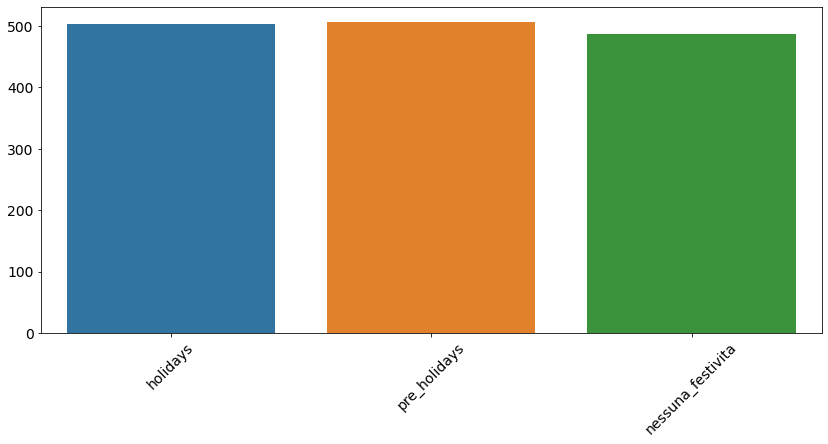

In [45]:
values = [

    media_festivi.drop(['holidays', 'pre_holidays']).sum(),
    media_prefestivi.drop(['holidays', 'pre_holidays']).sum(),
    media_nessuna_festivita.drop(['holidays', 'pre_holidays']).sum(),

]

plt.figure(figsize=(14, 6))
sns.barplot(y=values, x=['holidays', 'pre_holidays', 'nessuna_festivita'], palette="tab10")
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [46]:
df_grafici['holidays'] = False
df_grafici.loc[df_grafici.date.isin(festivita), 'holidays'] = True


df_grafici['pre_holidays'] = df_grafici['holidays'].shift(-1)
df_grafici.dropna(inplace=True)


df_grafici['giorni']=''
df_grafici.loc[(df_grafici.holidays == False) & (df_grafici.pre_holidays == False),'giorni']='nessuna_festivita'
df_grafici.loc[(df_grafici.holidays == True),'giorni']='festivi'
df_grafici.loc[(df_grafici.holidays == False) & (df_grafici.pre_holidays == True),'giorni']='prefestivi'

In [47]:
df_grafici_sum['holidays'] = False
df_grafici_sum.loc[df_grafici_sum.index.isin(festivita), 'holidays'] = True


df_grafici_sum['pre_holidays'] = df_grafici_sum['holidays'].shift(-1)
df_grafici_sum.dropna(inplace=True)


df_grafici_sum['giorni']=''
df_grafici_sum.loc[(df_grafici_sum.holidays == False) & (df_grafici_sum.pre_holidays == False),'giorni']='nessuna_festivita'
df_grafici_sum.loc[(df_grafici_sum.holidays == True),'giorni']='festivi'
df_grafici_sum.loc[(df_grafici_sum.holidays == False) & (df_grafici_sum.pre_holidays == True),'giorni']='prefestivi'



<Figure size 1008x432 with 0 Axes>

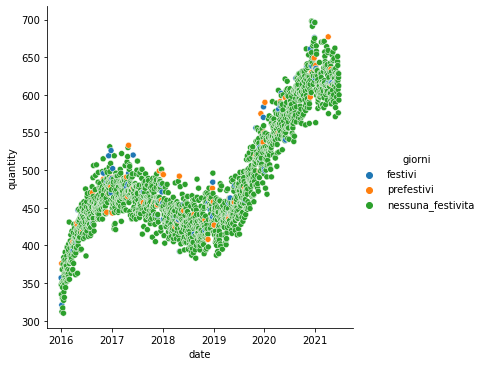

In [48]:
plt.figure(figsize=(14, 6))
sns.relplot(x="date", y="quantity", hue="giorni", data=df_grafici_sum,hue_order=['festivi','prefestivi','nessuna_festivita'])
plt.show()

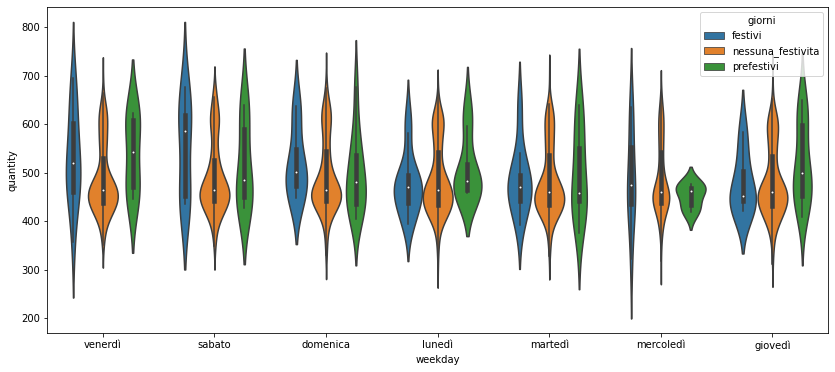

In [49]:

plt.figure(figsize=(14, 6))
sns.violinplot(x="weekday", y="quantity", hue="giorni", data=df_grafici_sum)
plt.show()

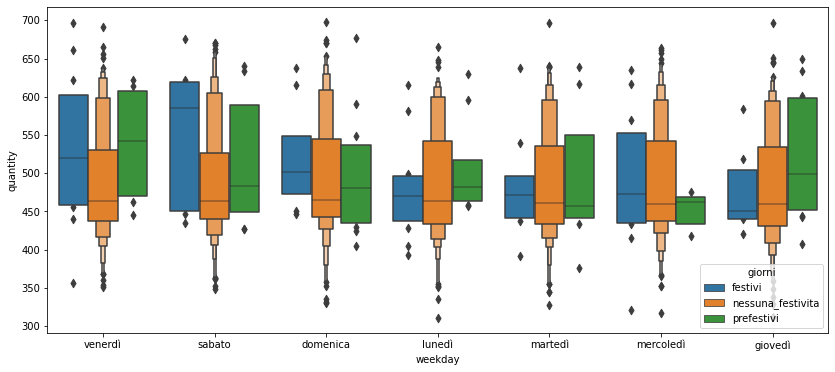

In [50]:
plt.figure(figsize=(14, 6))
sns.boxenplot(x="weekday", y="quantity", hue="giorni", data=df_grafici_sum)
plt.show()




### Quanto vendiamo mediamente nei giorni festivi, pre festivi e nei giorni lavorativi per le singole categorie?

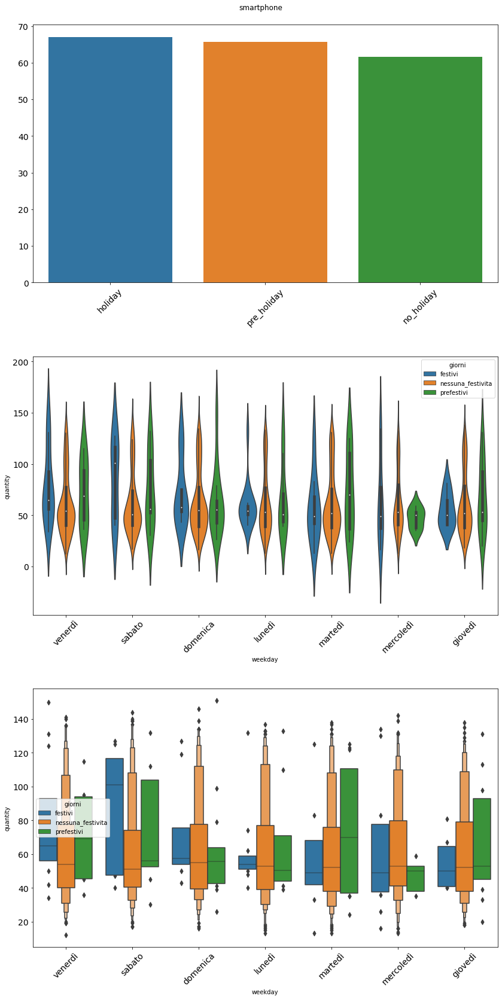

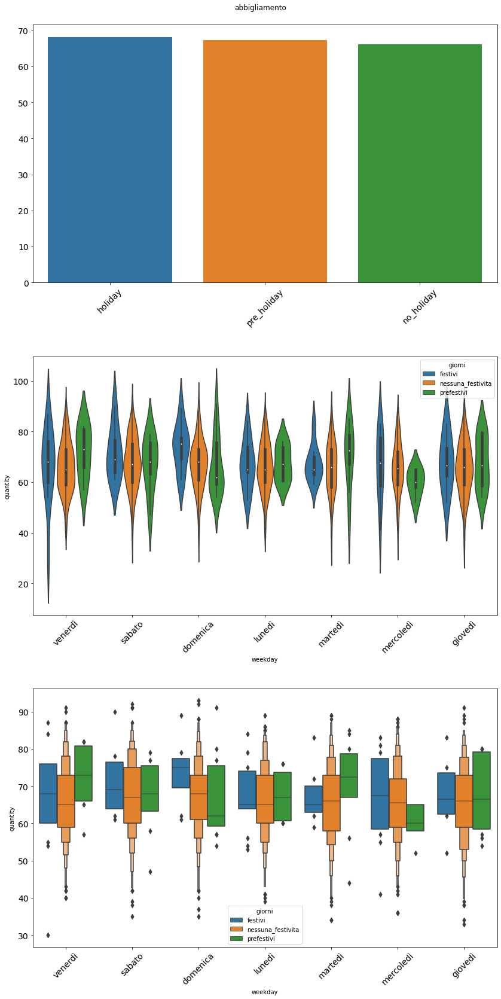

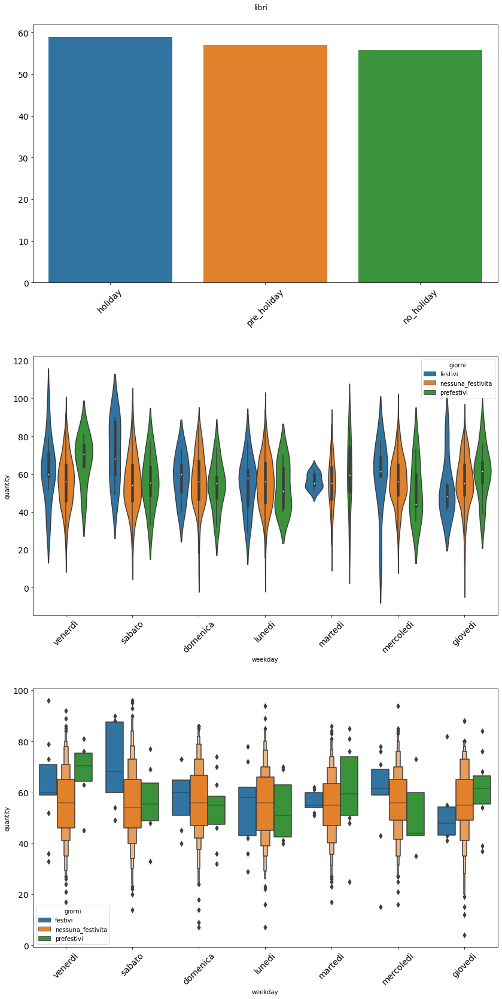

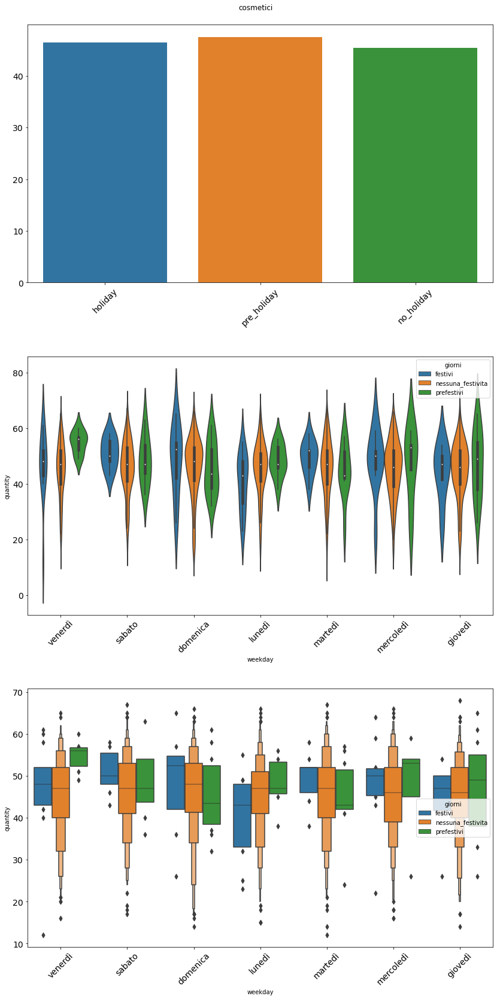

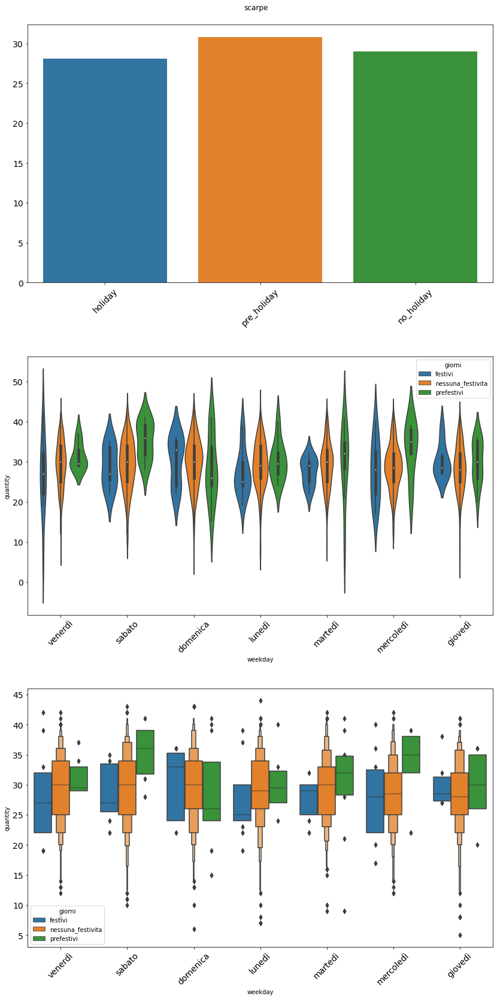

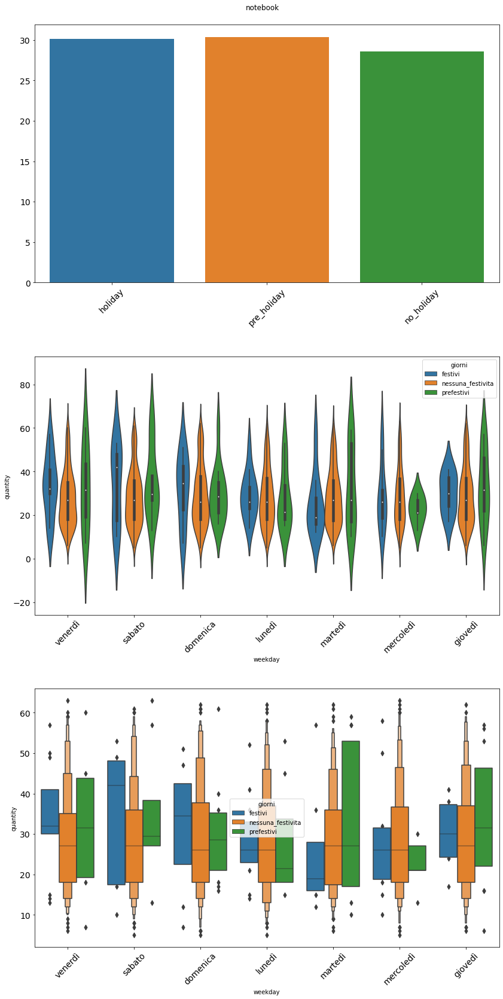

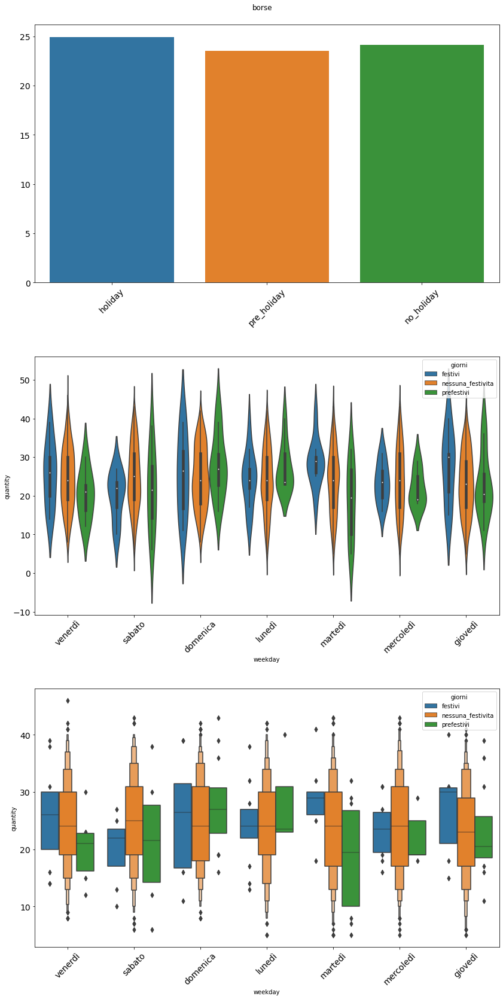

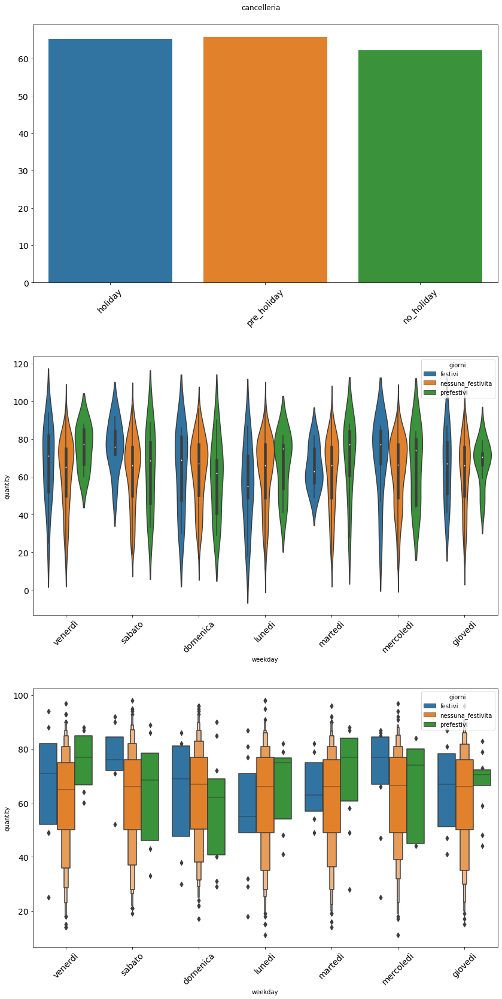

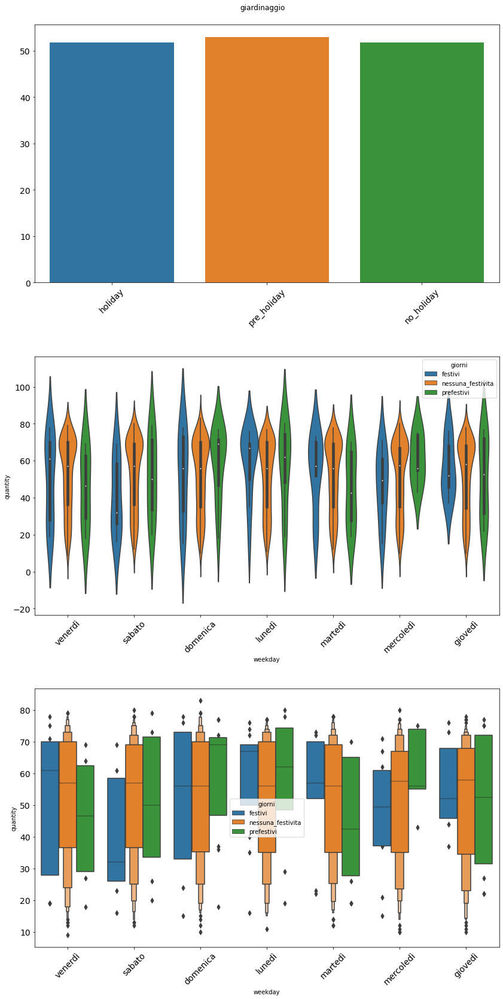

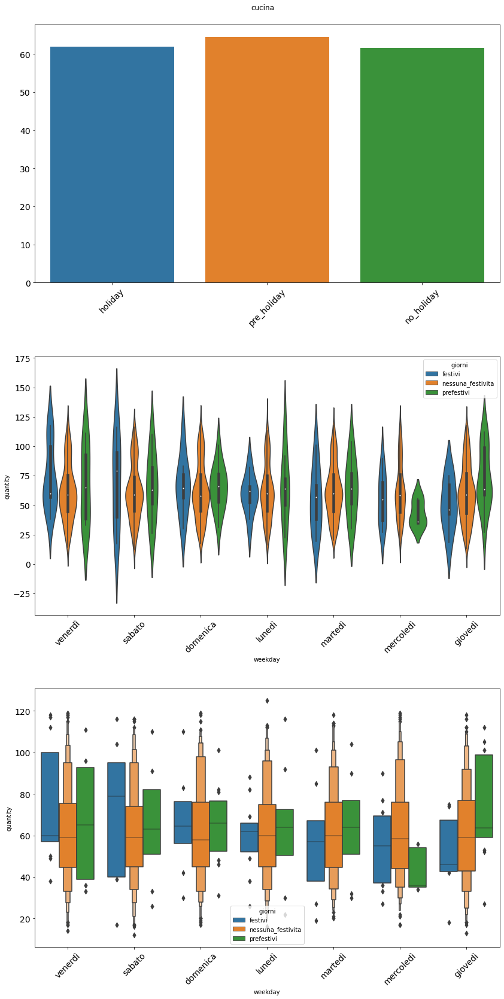

In [51]:
for categoria in df_grafici.category.unique():
    valori_da_visualizzare = [

        media_festivi[categoria],
        media_prefestivi[categoria],
        media_nessuna_festivita[categoria],

    ]

    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, ncols=1, figsize=(14, 24))
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
    fig.suptitle(f'{categoria}')
    fig.subplots_adjust(top=0.96)



    sns.barplot(y=valori_da_visualizzare, x=['holiday', 'pre_holiday', 'no_holiday'], palette="tab10", ax=ax1)
    ax1.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)


    sns.violinplot(x="weekday", y="quantity", hue="giorni", data=df_grafici[df_grafici.category==categoria], ax=ax2)
    ax2.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax2.tick_params(axis='y', labelsize=14)


    sns.boxenplot(x="weekday", y="quantity", hue="giorni", data=df_grafici[df_grafici.category==categoria], ax=ax3)
    ax3.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax3.tick_params(axis='y', labelsize=14)

    plt.show()

### Il black friday influisce nel mercato italiano?

In [52]:
nessuna_festivita = df[(df.holidays == False) & (df.pre_holidays == False)]
festivi = df[(df.holidays == True) & (~ df.index.isin(black_friday))]
prefestivi = df[(df.holidays == False) & (df.pre_holidays == True)]
df_black_friday = df[(df.index.isin(black_friday))]

media_festivi = (festivi.sum() / len(festivi))
media_prefestivi = (prefestivi.sum() / len(prefestivi))
media_nessuna_festivita = (nessuna_festivita.sum() / len(nessuna_festivita))
media_black_friday = (df_black_friday.sum() / len(df_black_friday))

### Quanto vendiamo mediamente nei giorni festivi, pre festivi e nei giorni lavorativi?

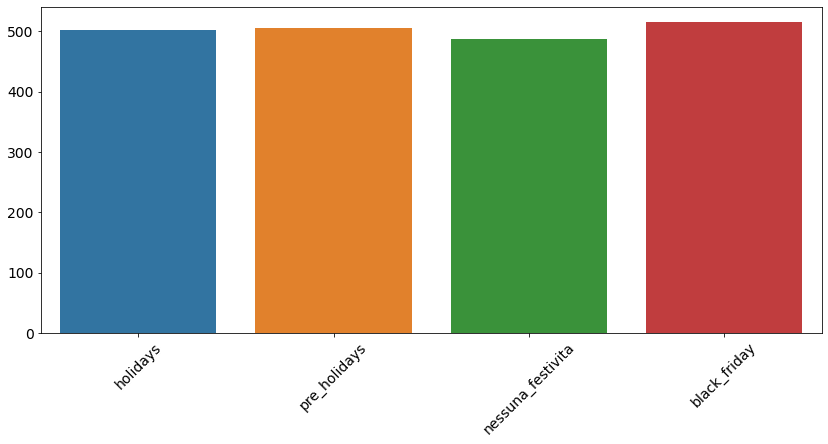

In [53]:
valori_da_visualizzare = [

    media_festivi.drop(['holidays', 'pre_holidays']).sum(),
    media_prefestivi.drop(['holidays', 'pre_holidays']).sum(),
    media_nessuna_festivita.drop(['holidays', 'pre_holidays']).sum(),
    media_black_friday.drop(['holidays', 'pre_holidays']).sum(),

]

plt.figure(figsize=(14, 6))
sns.barplot(
    y=valori_da_visualizzare,
    x=['holidays', 'pre_holidays', 'nessuna_festivita', 'black_friday'],
    palette="tab10"
)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [54]:
df_grafici['holidays'] = False
df_grafici.loc[df_grafici.date.isin(festivita), 'holidays'] = True


df_grafici['pre_holidays'] = df_grafici['holidays'].shift(-1)
df_grafici.dropna(inplace=True)


df_grafici['giorni']=''
df_grafici.loc[(df_grafici.holidays == False) & (df_grafici.pre_holidays == False),'giorni']='nessuna_festivita'
df_grafici.loc[(df_grafici.holidays == True) & (~ df_grafici.index.isin(black_friday)),'giorni']='festivi'
df_grafici.loc[(df_grafici.holidays == False) & (df_grafici.pre_holidays == True) & (~ df_grafici.index.isin(black_friday)),'giorni']='prefestivi'
df_grafici.loc[( df_grafici.index.isin(black_friday)),'giorni']='black_friday'


In [55]:
df_grafici_sum['holidays'] = False
df_grafici_sum.loc[df_grafici_sum.index.isin(festivita), 'holidays'] = True


df_grafici_sum['pre_holidays'] = df_grafici_sum['holidays'].shift(-1)
df_grafici_sum.dropna(inplace=True)


df_grafici_sum['giorni']=''
df_grafici_sum.loc[(df_grafici_sum.holidays == False) & (df_grafici_sum.pre_holidays == False),'giorni']='nessuna_festivita'
df_grafici_sum.loc[(df_grafici_sum.holidays == True) & (~ df_grafici_sum.index.isin(black_friday)),'giorni']='festivi'
df_grafici_sum.loc[(df_grafici_sum.holidays == False) & (df_grafici_sum.pre_holidays == True) & (~ df_grafici_sum.index.isin(black_friday)),'giorni']='prefestivi'
df_grafici_sum.loc[( df_grafici_sum.index.isin(black_friday)),'giorni']='black_friday'


<Figure size 1008x432 with 0 Axes>

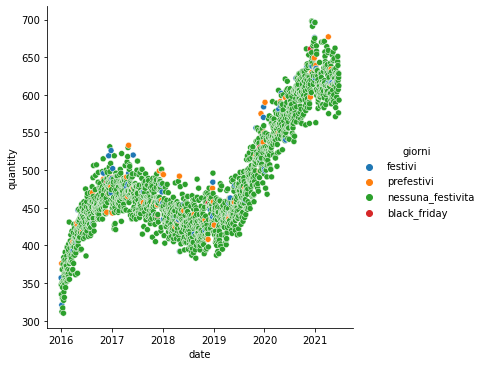

In [56]:
plt.figure(figsize=(14, 6))
sns.relplot(x="date", y="quantity", hue="giorni", data=df_grafici_sum,hue_order=['festivi','prefestivi','nessuna_festivita','black_friday'])
plt.show()

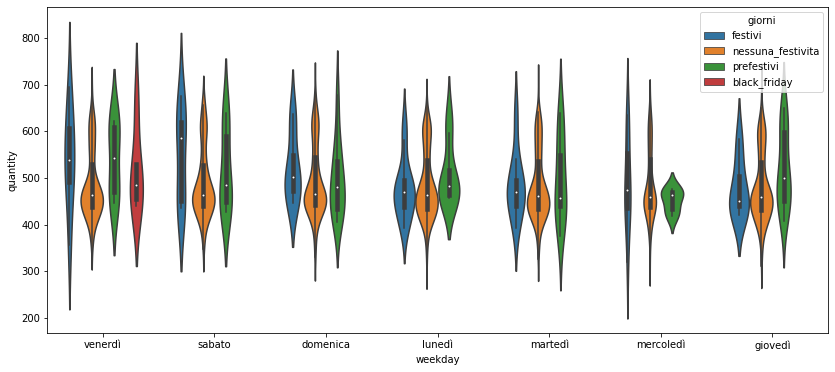

In [57]:

plt.figure(figsize=(14, 6))
sns.violinplot(x="weekday", y="quantity", hue="giorni", data=df_grafici_sum)
plt.show()

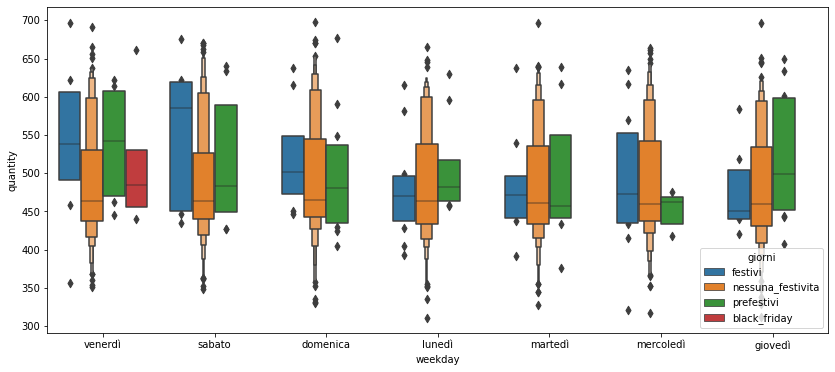

In [58]:
plt.figure(figsize=(14, 6))
sns.boxenplot(x="weekday", y="quantity", hue="giorni", data=df_grafici_sum)
plt.show()


### Quanto vendiamo mediamente nei giorni festivi, pre festivi e nei giorni lavorativi per le singole categorie?

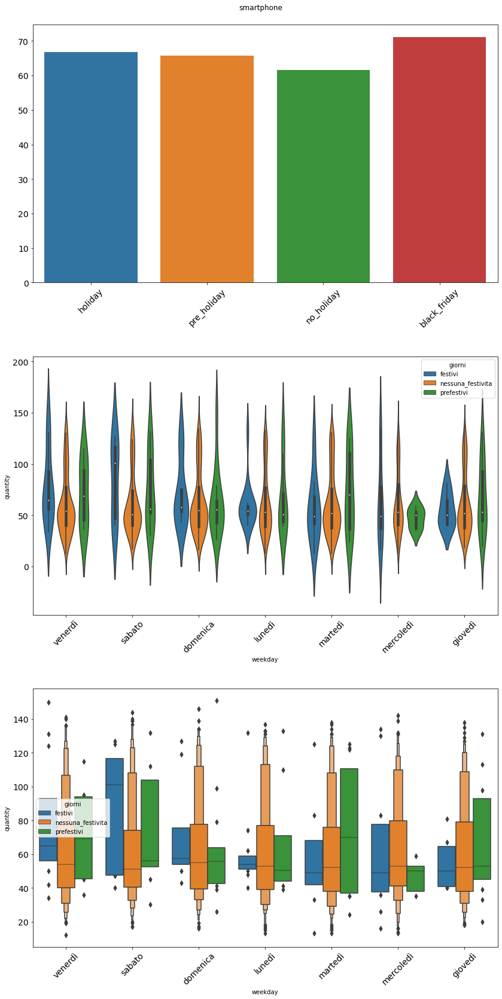

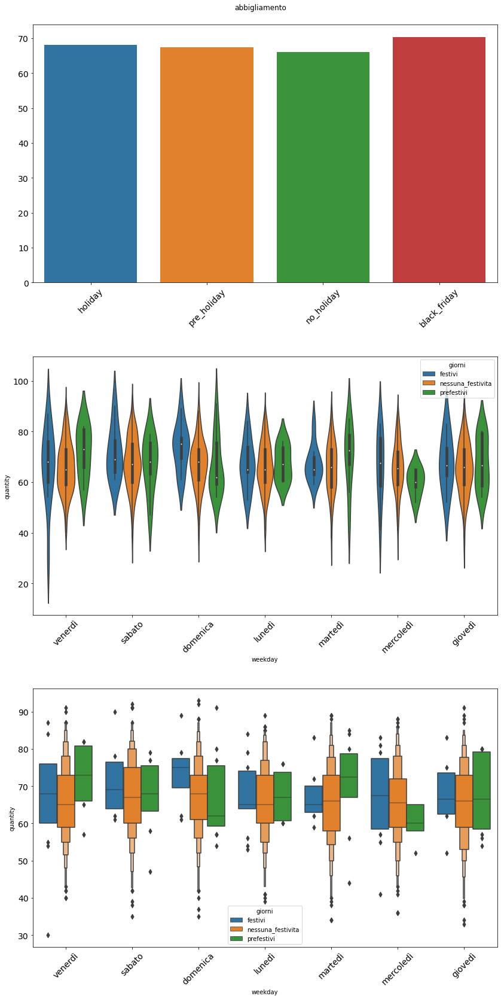

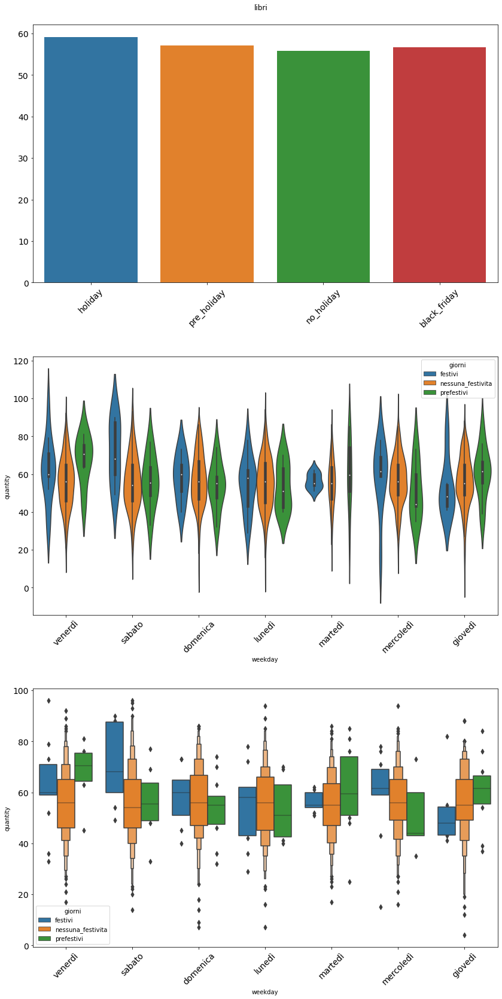

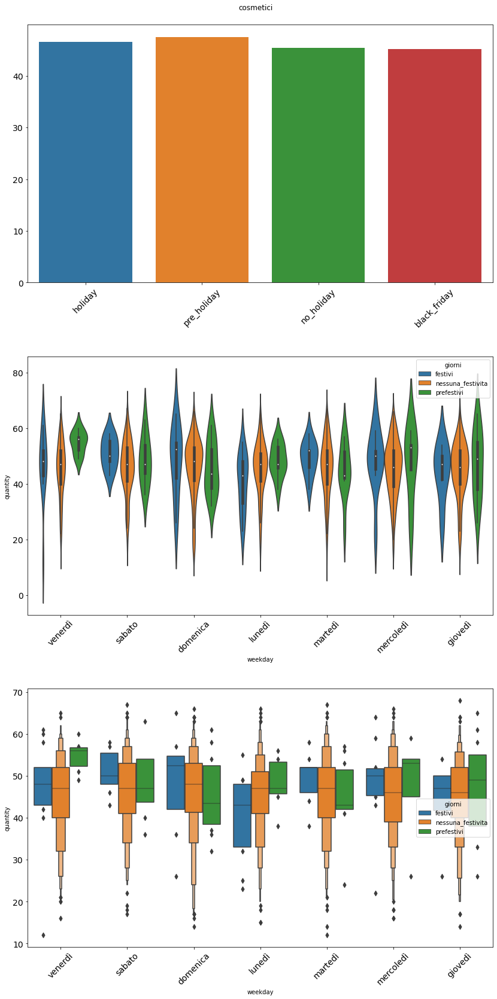

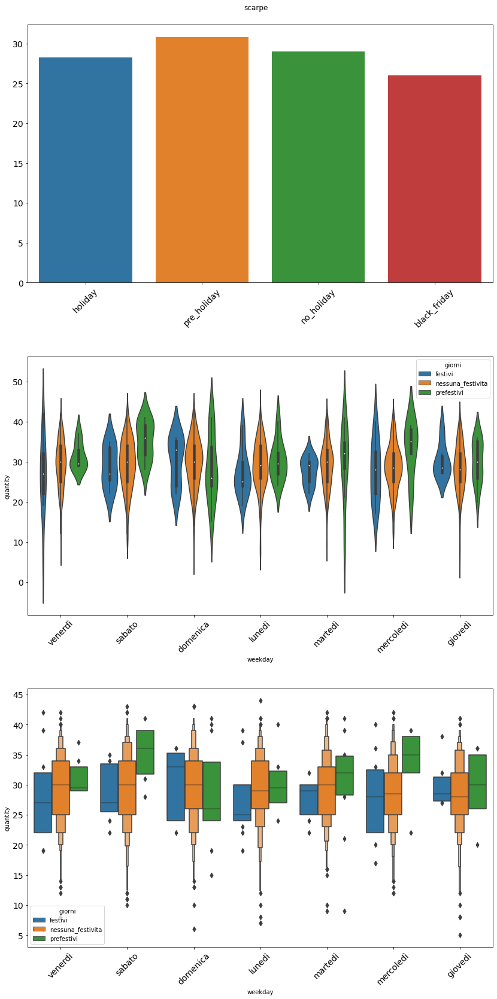

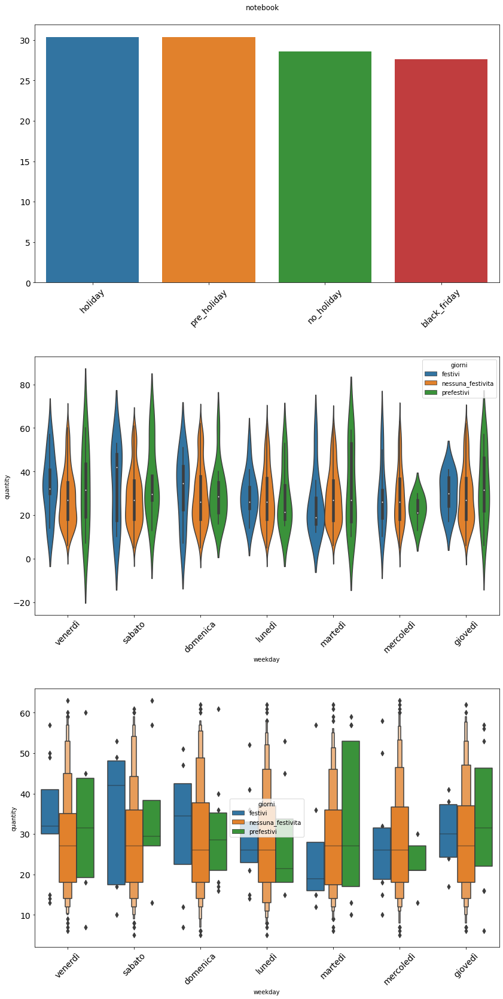

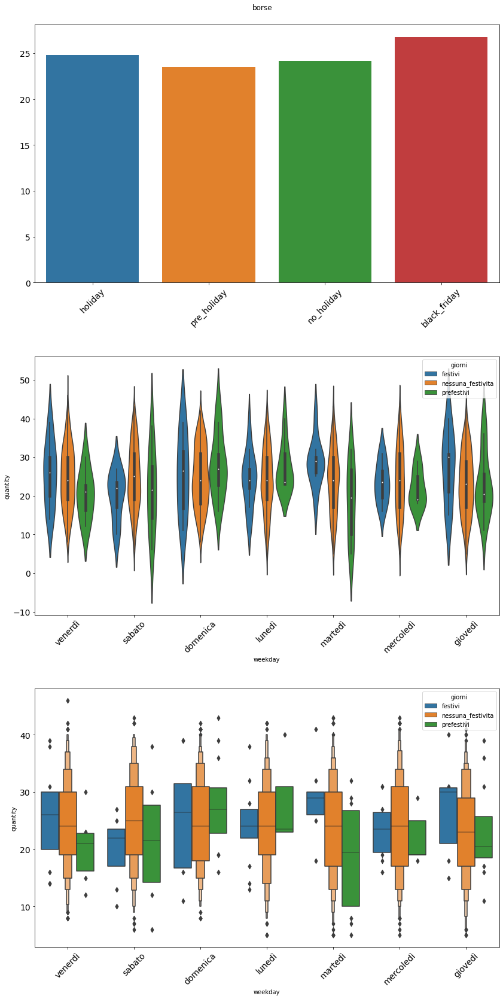

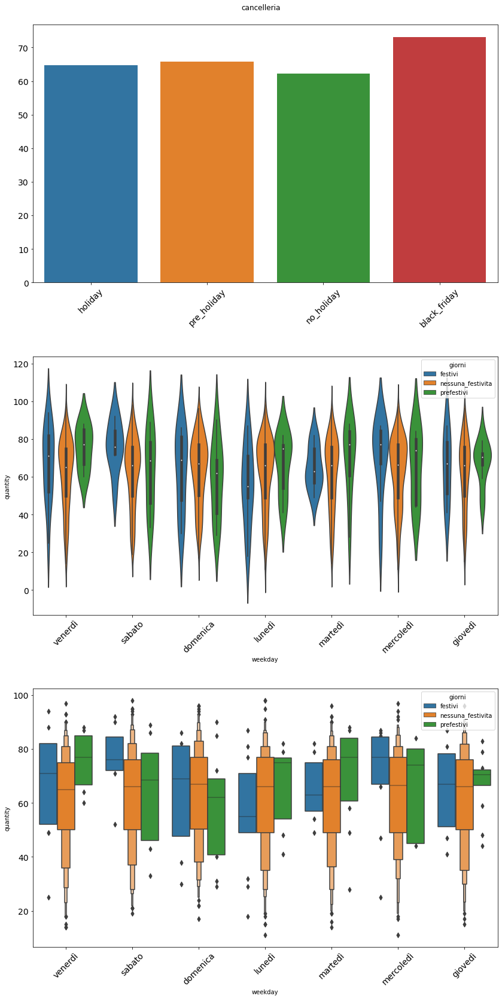

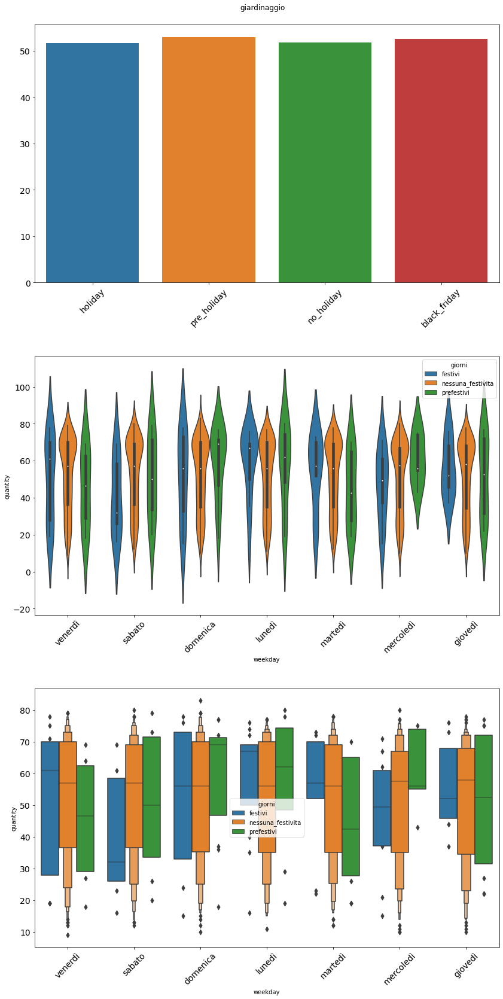

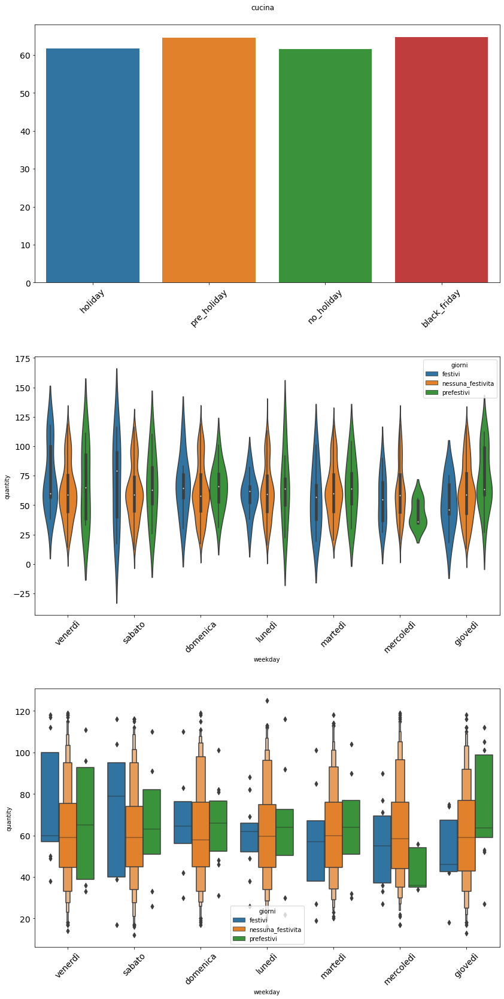

In [59]:
for categoria in df_grafici.category.unique():
    valori_da_visualizzare = [

        media_festivi[categoria],
        media_prefestivi[categoria],
        media_nessuna_festivita[categoria],
        media_black_friday[categoria],

    ]



    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, ncols=1, figsize=(14, 24))
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
    fig.suptitle(f'{categoria}')
    fig.subplots_adjust(top=0.96)



    sns.barplot(y=valori_da_visualizzare, x=['holiday', 'pre_holiday', 'no_holiday', 'black_friday'], palette="tab10", ax=ax1)
    ax1.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)


    sns.violinplot(x="weekday", y="quantity", hue="giorni", data=df_grafici[df_grafici.category==categoria], ax=ax2)
    ax2.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax2.tick_params(axis='y', labelsize=14)


    sns.boxenplot(x="weekday", y="quantity", hue="giorni", data=df_grafici[df_grafici.category==categoria], ax=ax3)
    ax3.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax3.tick_params(axis='y', labelsize=14)

    plt.show()

Salviamo il dataframe `df` creato fino ad ora in modo da poter sospendere e
riprendere il progetto senza rieseguire tutte le celle precedenti.

In [60]:
with open(f'{percorso_base}data.pickle', 'wb') as file:
    pickle.dump(df, file)

Carichiamo i dati

In [61]:
with open(f'{percorso_base}data.pickle', 'rb') as file:
    df = pickle.load(file)

In [62]:
df.head()

,smartphone,abbigliamento,libri,cosmetici,scarpe,notebook,borse,cancelleria,giardinaggio,cucina,holidays,pre_holidays
date,,,,,,,,,,,,
2016-01-01,60,30,33,12,6,34,23,25,75,59,True,False
2016-01-02,45,38,27,27,14,36,21,19,71,50,False,False
2016-01-03,51,37,7,23,15,37,16,28,72,49,False,False
2016-01-04,57,39,16,20,19,37,21,15,69,42,False,False
2016-01-05,71,44,25,24,9,41,7,28,70,57,False,True


## Preparazione dati per la nostra tipologia di modello

Creiamo un metodo che ordini i dati e crei il dataframe `df_obiettivo` che aggrega i dati sfruttando una finestra
di 7 giorni che contenga anche il numero di giorni festivi e prefestivi nella settimana

In [63]:
def creazione_df_obbiettivo(df, categorie_target, days=7):
    df.sort_index(inplace=True)
    df_obiettivo = df[categorie_target + ['holidays'] + ['pre_holidays']].rolling(f'{days}d').sum().reset_index()
    df_obiettivo['date'] = (df_obiettivo['date'] - pd.Timedelta(days=days))
    df_obiettivo.set_index('date', inplace=True)

    '''
                        smartphone  abbigliamento  libri  cosmetici  scarpe  notebook  \
        date
        2015-12-25        60.0           30.0   33.0       12.0     6.0      34.0
        2015-12-26       105.0           68.0   60.0       39.0    20.0      70.0
        2015-12-27       156.0          105.0   67.0       62.0    35.0     107.0
        2015-12-28       213.0          144.0   83.0       82.0    54.0     144.0
        2015-12-29       284.0          188.0  108.0      106.0    63.0     185.0
        2015-12-30       329.0          229.0  123.0      128.0    80.0     215.0
        2015-12-31       388.0          262.0  127.0      148.0    92.0     249.0
        2016-01-01       379.0          272.0  122.0      162.0    94.0     249.0
        2016-01-02       395.0          276.0  117.0      160.0    92.0     253.0
        2016-01-03       406.0          281.0  124.0      154.0    90.0     246.0

                    borse  cancelleria  giardinaggio  cucina  holidays  pre_holidays
        date
        2015-12-25   23.0         25.0          75.0    59.0       1.0           0.0
        2015-12-26   44.0         44.0         146.0   109.0       1.0           0.0
        2015-12-27   60.0         72.0         218.0   158.0       1.0           0.0
        2015-12-28   81.0         87.0         287.0   200.0       1.0           0.0
        2015-12-29   88.0        115.0         357.0   257.0       1.0           1.0
        2015-12-30  107.0        140.0         424.0   297.0       2.0           1.0
        2015-12-31  120.0        162.0         497.0   339.0       2.0           1.0
        2016-01-01  112.0        167.0         488.0   333.0       1.0           1.0
        2016-01-02  109.0        178.0         489.0   329.0       1.0           1.0
        2016-01-03  112.0        167.0         487.0   326.0       1.0           1.0

    '''
    return df_obiettivo

Creiamo un metodo che sfrutti il metodo precedente ed aggiunga ad ogni data l'autput desiderato, con suffisso '_target'
 e le festività nei 7 giorni successivi

In [64]:
def prepara_df(df, categorie_target, giorni_previsione=30):
    df_obiettivo = creazione_df_obbiettivo(df, categorie_target, days=giorni_previsione)

    df = df.join(df_obiettivo, how='left', rsuffix='_target')

    df.holidays = df.holidays_target
    df.pre_holidays = df.pre_holidays_target
    df.drop(['holidays_target', 'pre_holidays_target'], axis=1, inplace=True)

    # Aggiungiamo le colonne anno mese giorno e giorno della settimana per poter sfruttare queste informazioni
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['weekday'] = df.index.weekday

    '''
                        smartphone  abbigliamento  libri  cosmetici  scarpe  notebook  \
        date
        2016-01-01          60             30     33         12       6        34
        2016-01-02          45             38     27         27      14        36
        2016-01-03          51             37      7         23      15        37
        2016-01-04          57             39     16         20      19        37
        2016-01-05          71             44     25         24       9        41
        2016-01-06          45             41     15         22      17        30
        2016-01-07          59             33      4         20      12        34
        2016-01-08          51             40     28         26       8        34
        2016-01-09          61             42     22         25      12        40
        2016-01-10          62             42     14         17      13        30

                    borse  cancelleria  giardinaggio  cucina  ...  scarpe_target  \
        date                                                  ...
        2016-01-01     23           25            75      59  ...           94.0
        2016-01-02     21           19            71      50  ...           92.0
        2016-01-03     16           28            72      49  ...           90.0
        2016-01-04     21           15            69      42  ...           86.0
        2016-01-05      7           28            70      57  ...           87.0
        2016-01-06     19           25            67      40  ...           87.0
        2016-01-07     13           22            73      42  ...           80.0
        2016-01-08     15           30            66      53  ...           87.0
        2016-01-09     18           30            72      46  ...           87.0
        2016-01-10     19           17            70      46  ...           87.0

                    notebook_target  borse_target  cancelleria_target  \
        date
        2016-01-01            249.0         112.0               167.0
        2016-01-02            253.0         109.0               178.0
        2016-01-03            246.0         112.0               167.0
        2016-01-04            245.0         106.0               163.0
        2016-01-05            239.0         118.0               149.0
        2016-01-06            245.0         110.0               143.0
        2016-01-07            247.0         111.0               141.0
        2016-01-08            249.0         109.0               126.0
        2016-01-09            249.0          98.0               123.0
        2016-01-10            252.0          94.0               136.0

                    giardinaggio_target  cucina_target  year  month  day  weekday
        date
        2016-01-01                488.0          333.0  2016      1    1        4
        2016-01-02                489.0          329.0  2016      1    2        5
        2016-01-03                487.0          326.0  2016      1    3        6
        2016-01-04                494.0          349.0  2016      1    4        0
        2016-01-05                495.0          345.0  2016      1    5        1
        2016-01-06                494.0          344.0  2016      1    6        2
        2016-01-07                489.0          347.0  2016      1    7        3
        2016-01-08                501.0          348.0  2016      1    8        4
        2016-01-09                493.0          352.0  2016      1    9        5
        2016-01-10                491.0          361.0  2016      1   10        6

    '''

    return df

In [65]:
def creazione_np(df, giorni, inizio, intervallo_di_date):
    '''
    Costruiamo i dataset con cui addestrare il modello nel formato numpy che si aspetta il framework da noi utilizzato
    sfruttando i dataframe ricevuti in input
    '''
    colonne = [col for col in df.columns if not col.endswith("_target")]
    colonne_obbiettivo = [col for col in df.columns if col.endswith("_target")]

    np_input = []
    np_output = []

    for n in range(len(colonne_obbiettivo)):
        np_output.append([])

    for date in intervallo_di_date:
        if date > inizio + timedelta(days=giorni - 1):
            inputs = df.loc[date - timedelta(days=giorni - 1):date, colonne].values
            output = df.loc[date, colonne_obbiettivo].values

            if len(inputs) == giorni:
                np_input.append(inputs)
                for n in range(len(colonne_obbiettivo)):
                    np_output[n].append([output[n]])

            else:
                print(inputs.shape)
                raise Exception('Dati non conformi')
        else:
            raise Exception('Date non sufficenti')

    np_input = np.asarray(np_input, dtype=np.float32)
    np_output = np.asarray(np_output, dtype=np.float32)
    return np_input, np_output

In [66]:
def normalizza_np(np_cumulativo, np_max, np_min, a=0.8, b=0.2):
    np_normalizzato = (((np_cumulativo - np_min) / (np_max - np_min)) * (a - b)) + b
    np_normalizzato = np.nan_to_num(np_normalizzato, nan=b, posinf=b, neginf=b)
    return np_normalizzato


def normalizza_input(np_array):
    '''
    Normalizzazione degli input e restituzione dei vettori massimo e minimo
    '''
    np_max = np.max(np_array, axis=(0, 1), keepdims=True)
    np_min = np.min(np_array, axis=(0, 1), keepdims=True)
    np_array = normalizza_np(np_array, np_max, np_min)
    return np_array, np_max, np_min


def normalizza_output(np_array):
    '''
    Normalizzazione degli output e restituzione dei vettori massimo e minimo
    '''
    np_max = np.max(np_array, axis=(1, 2), keepdims=True)
    np_min = np.min(np_array, axis=(1, 2), keepdims=True)
    np_array = normalizza_np(np_array, np_max, np_min)
    return np_array, np_max, np_min


def denormalizza_np(np_normalizzato, np_max, np_min, a=0.8, b=0.2):
    np_denormalizzato = (((np_normalizzato - b) / (a - b)) * (np_max - np_min)) + np_min
    return np_denormalizzato

In [67]:
def controllo_presenza_di_valori_nan(np_input, np_output):
    if np.isnan(np.sum(np_input)):
        raise Exception('Rilevati NaN su np_input')
    np_output = np.asarray(np_output, dtype=np.float32)
    if np.isnan(np.sum(np_output)):
        raise Exception('Rilevati NaN su np_output')

def controllo_normalizzazione(np_input, np_output, a=0.8, b=0.2):
    if (np_input < b).any() or (np_input > a).any():
        raise Exception('Normalizzazione fallita per np_input')
    if (np_output < b).any() or (np_output > a).any():
        raise Exception('Normalizzazione fallita per np_output')

def controllo_presenza_di_valori_inf(np_input, np_output):
    if np.isinf(np.sum(np_input)):
        raise Exception('Rilevati inf su np_input')
    if np.isinf(np.sum(np_output)):
        raise Exception('Rilevati inf su np_output')

In [68]:
def creazione_dataset(df,
                      giorni=365,  # n° giorni della sequenza temporale di un esempio - un anno
                      giorni_addestramento=1096,  # n° esempi di train - tre anni
                      giorni_test=7,  # n° esempi di test - una settimana
                      giorni_validazione=14,  # n° esempi di validazione (usata anche per selezionare il miglior modello)
                      data_iniziale=None,
                      ):
    # costruiamo il dataset che raccoglie tutte le informazioni da fornire in input

    if data_iniziale is None:
        data_iniziale = df.index.min().to_pydatetime()
    else:
        data_iniziale = max(df.index.min().to_pydatetime(), data_iniziale)

    inizio_train = data_iniziale + timedelta(days=giorni)
    fine_train = inizio_train + timedelta(days=giorni_addestramento - 1)

    inizio_val_e_test = fine_train - timedelta(days=giorni_validazione - 1)
    fine_val_e_test = inizio_val_e_test + timedelta(days=giorni_test) + timedelta(days=giorni_validazione - 1)

    intervallo_di_date_train = pd.date_range(inizio_train, fine_train, freq='D').tolist()
    intervallo_di_date_val_e_test = pd.date_range(inizio_val_e_test, fine_val_e_test, freq='D').tolist()
    colonne_obbiettivo = [col for col in df.columns if col.endswith("_target")]

    indici_categorie = {}

    for n, target_col in enumerate(colonne_obbiettivo):
        indici_categorie[n] = target_col.replace('_target', '')

    np_input_train, np_output_train = creazione_np(df, giorni, data_iniziale, intervallo_di_date_train)

    np_input_val_e_test, np_output_val_e_test = creazione_np(df, giorni, data_iniziale, intervallo_di_date_val_e_test)

    np_input_train, input_max, input_min = normalizza_input(np_input_train)

    np_output_train, output_max, output_min = normalizza_output(np_output_train)

    np_input_val_e_test = normalizza_np(np_input_val_e_test, input_max, input_min)

    np_output_val_e_test = normalizza_np(np_output_val_e_test, output_max, output_min)

    controllo_presenza_di_valori_nan(np_input_train, np_output_train)
    controllo_presenza_di_valori_nan(np_input_val_e_test, np_output_val_e_test)

    controllo_presenza_di_valori_inf(np_input_train, np_output_train)
    controllo_presenza_di_valori_inf(np_input_val_e_test, np_output_val_e_test)

    controllo_normalizzazione(np_input_train, np_output_train)

    # visualizzazione dimensioni dataset a scopo di debug

    print('\n\n--dataset creati--')
    print('Input:', np_input_train.shape)
    print('Output   :', np_output_train.shape)

    print('\n\n--dataset creati Validazione e Test-------------------------')
    print('Input:', np_input_val_e_test.shape)
    print('Output   :', np_output_val_e_test.shape)
    print('\n\n----------------------------------------------')

    return (np_input_train,
            np_output_train,
            np_input_val_e_test,
            np_output_val_e_test,
            output_max,
            output_min,
            input_max,
            input_min,
            indici_categorie,
            )

## Modello Predittivo
Creiamo una funzione per generare il modello, in questo modo sarà possibile
richiamare questa funzione all'interno di un ciclo più complesso che governerà
l'intero addestramento
![modello](images\model.png)

In [69]:
def get_highway_block(input, input_processed):
    T = tf.keras.layers.Conv1D(input.shape[-1], 1, activation='sigmoid', bias_initializer=tf.keras.initializers.Constant(42.))(input)
    only_ones = tf.keras.layers.Lambda(lambda x: K.ones_like(x))(T)
    _T = tf.keras.layers.Subtract()([only_ones, T])
    _input = tf.keras.layers.Multiply()([input, T])
    _input_processed = tf.keras.layers.Multiply()([input_processed, _T])
    return tf.keras.layers.Add()([_input_processed, _input])

def get_transformer_block(inputs, num_heads, dim, dropout=0.):
    att_output = tf.keras.layers.MultiHeadAttention(
        num_heads=num_heads,
        key_dim=dim
    )(inputs, inputs)
    att_output = tf.keras.layers.Dropout(dropout)(att_output)
    att_output = get_highway_block(inputs, att_output)
    att_output = tf.keras.layers.LayerNormalization(epsilon=1e-9)(att_output)
    conv_3 = tf.keras.layers.Conv1D(dim, kernel_size=3, activation='swish', padding='same')(att_output)
    conv_7 = tf.keras.layers.Conv1D(dim, kernel_size=7, activation='swish', padding='same')(att_output)
    conv = tf.keras.layers.Add()([conv_3, conv_7])
    conv_1 = tf.keras.layers.Conv1D(dim, kernel_size=1)(conv)
    conv_1 = tf.keras.layers.Dropout(dropout)(conv_1)
    output = get_highway_block(att_output, conv_1)
    output = tf.keras.layers.LayerNormalization(epsilon=1e-9)(output)
    return output


def crea_modello(np_input, np_output, cells=64, lr=0.001, dropout=0.):
    tensorflow.keras.backend.clear_session()

    net_inputs = tf.keras.layers.Input(
        shape=(np_input.shape[1:]),
        name='inputs'
    )

    half_cells = int(cells / 2)
    quarter_cells = int(cells / 4)
    eighth_cells = int(cells / 8)

    external_block = tf.keras.layers.Conv1D(quarter_cells, kernel_size=1)(net_inputs)
    external_block = get_transformer_block(inputs=external_block, num_heads=quarter_cells, dim=quarter_cells, dropout=dropout)
    external_block = tf.keras.layers.LSTM(quarter_cells, dropout=dropout, return_sequences=True)(external_block)

    net_outputs = []
    for _ in range(np_output.shape[0]):
        _tpe = tf.keras.layers.Conv1D(cells, kernel_size=1)(external_block)
        _tpe = get_transformer_block(inputs=_tpe, num_heads=eighth_cells, dim=cells, dropout=dropout)

        _out_n = tf.keras.layers.LSTM(half_cells, return_sequences=True)(_tpe)
        _out_n = tf.keras.layers.LSTM(half_cells, return_sequences=True)(_out_n)

        _out = tf.keras.layers.LSTM(1)(_out_n)
        net_outputs.append(_out)

    model = tf.keras.Model(
        inputs=net_inputs,
        outputs=net_outputs
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            epsilon=1e-9,
            learning_rate=lr
        ),
        loss=tf.keras.losses.mae,#median_absolute_error,#tf.keras.losses.mse,
        metrics=tf.keras.metrics.mae,
    )
    return model

Creiamo una callback che ci stampi e usi le nostre metriche.

In [70]:
class SupervisoreAddestramento(Callback):
    def __init__(self, np_input_val_e_test, np_output_val_e_test, giorni_validazione,
                 indici_categorie, inizio_loss=999999, model_weight_dir='./weights',
                 verbose=True):
        super(SupervisoreAddestramento, self).__init__()

        self.errs_validazione_mean = inizio_loss
        self.errs_validazione_perc_mean = 1
        self.model_weight_dir = model_weight_dir

        self.np_input_val_e_test = np_input_val_e_test
        self.np_output_val_e_test = np_output_val_e_test[:, :, 0]  # riduzione dimensionale
        self.giorni_validazione = giorni_validazione
        self.indici_categorie = indici_categorie
        self.verbose = verbose

    def on_epoch_end(self, epoch, logs=None):
        weight_saved = False  # usato per il log
        loss = logs['loss']
        predizioni = self.model.predict([self.np_input_val_e_test])
        predizioni = np.asarray(predizioni, dtype=np.float32)
        if predizioni.ndim == 3:
            predizioni = predizioni[:, :, 0]
            # riduzione dimensionale
        elif predizioni.ndim == 2:
            predizioni = predizioni.transpose()

        errori = (self.np_output_val_e_test - predizioni)

        # calcolo degli errori in validazione e in test
        # facciamo ciò per salvare i migliori pesi (usando solo i valori di validazione)

        errori_validazione = errori[:, :self.giorni_validazione]
        errori_test = errori[:, self.giorni_validazione:]

        errs_validazione = np.abs(errori_validazione)

        mse_errs_validazione = ((errori_validazione) ** 2).mean()

        errs_validazione_mean = np.mean(errs_validazione)
        errs_validazione_max = np.max(errs_validazione)
        errs_validazione_min = np.min(errs_validazione)

        errs_validazione_perc = errs_validazione / self.np_output_val_e_test[:, :self.giorni_validazione]

        errs_validazione_perc_mean = np.ma.masked_invalid(errs_validazione_perc).mean()
        errs_validazione_perc_max = np.ma.masked_invalid(errs_validazione_perc).max()
        errs_validazione_perc_min = np.ma.masked_invalid(errs_validazione_perc).min()

        errs_test = np.abs(errori_test)

        mse_errs_test = ((errori_test) ** 2).mean()

        errs_test_mean = np.mean(errs_test)
        errs_test_max = np.max(errs_test)
        errs_test_min = np.min(errs_test)

        errs_test_perc = np.abs(errs_test / self.np_output_val_e_test[:, self.giorni_validazione:])

        errs_test_perc_mean = np.ma.masked_invalid(errs_test_perc).mean()
        errs_test_perc_max = np.ma.masked_invalid(errs_test_perc).max()
        errs_test_perc_min = np.ma.masked_invalid(errs_test_perc).min()

        errs_test_mean_col = np.mean(errs_test, axis=1)
        errs_test_max_col = np.max(errs_test, axis=1)
        errs_test_min_col = np.min(errs_test, axis=1)

        errs_test_perc_mean_col = np.mean(errs_test_perc, axis=1)
        errs_test_perc_max_col = np.max(errs_test_perc, axis=1)
        errs_test_perc_min_col = np.min(errs_test_perc, axis=1)

        logs['val_loss'] = errs_validazione_mean
        logs['test_loss'] = errs_test_mean

        if errs_validazione_perc_mean < self.errs_validazione_perc_mean:
            self.model.save_weights(self.model_weight_dir)
            weight_saved = True

            self.loss = loss

            self.mse_errs_validazione = mse_errs_validazione
            self.errs_validazione_mean = errs_validazione_mean
            self.errs_validazione_max = errs_validazione_max
            self.errs_validazione_min = errs_validazione_min

            self.errs_validazione_perc_mean = errs_validazione_perc_mean
            self.errs_validazione_perc_max = errs_validazione_perc_max
            self.errs_validazione_perc_min = errs_validazione_perc_min

            self.mse_errs_test = mse_errs_test

            self.errs_test_mean = errs_test_mean
            self.errs_test_max = errs_test_max
            self.errs_test_min = errs_test_min

            self.errs_test_perc_mean = errs_test_perc_mean
            self.errs_test_perc_max = errs_test_perc_max
            self.errs_test_perc_min = errs_test_perc_min

        print('*' if weight_saved else ' ', ' Epoca', epoch,
              '\tloss {:<12}'.format(loss).ljust(25),
              'mse test {:<12}'.format(mse_errs_test).ljust(35),
              'mae % test {:<12}'.format("{:.9f}".format(errs_test_perc_mean)).ljust(25),
              'mae test {:<12}'.format("{:.9f}".format(errs_test_mean)).ljust(25),
              'mae % val {:<12}'.format("{:.9f}".format(errs_validazione_perc_mean)).ljust(25),
              "mae val {:<12}".format("{:.9f}".format(errs_validazione_mean)).ljust(25),
              '\t', datetime.now().strftime("%H:%M:%S"))
        if self.verbose:
            print(
                '.......................................................................................................')
            print('\r', '*' if weight_saved else ' ', epoch,
                  '\t', "indice".ljust(20), 'nome'.ljust(25), '   ',
                  '\t', "errore % val".ljust(25),
                  '\t', 'data', )

            for i, (
                    err_mean_col,
                    err_max_col,
                    err_min_col,
                    err_perc_mean,
                    err_perc_max,
                    err_perc_min
            ) in enumerate(zip(
                errs_test_mean_col,
                errs_test_max_col,
                errs_test_min_col,
                errs_test_perc_mean_col,
                errs_test_perc_max_col,
                errs_test_perc_min_col
            )):
                print('\r', '*' if weight_saved else ' ', epoch,
                      ('\t%f' % self.lr).ljust(20),
                      '\t', "{:<12}".format(i).ljust(20), self.indici_categorie[i].ljust(25), '   ',
                      '\t', "{:<12}".format("{:.9f}".format(err_perc_mean)).ljust(25),
                      '\t', datetime.now().strftime("%H:%M:%S"), )

### Configuriamo l'addestramento

In [71]:
date_inizio = (min(df.index))

giorni_previsione = 7

giorni_addestramento = 1024
giorni = 64
giorni_validazione = 7
giorni_test = 7

epochs = 500
batch = 256

cells = 64
lr = 0.001
dropout = 0.5

categorie_target = [x for x in df.columns.to_list() if x not in ['holidays', 'pre_holidays']]

### Creiamo il dataset

In [72]:
base_internal_dir = f"./weights/weights_{datetime.now().strftime('%Y-%m-%d_%H-%M-%S')}/"

model_weight_dir = f"{base_internal_dir}weights"

if not os.path.exists(base_internal_dir):
    os.makedirs(base_internal_dir)

df_prepared = prepara_df(df.copy(), categorie_target, giorni_previsione=giorni_previsione)
with open(f"{base_internal_dir}df.pickle", "wb") as file:
    pickle.dump(df_prepared, file)

(
    np_input_train,
    np_output_train,

    np_input_val_e_test,
    np_output_val_e_test,

    output_max,
    output_min,

    input_max,
    input_min,

    indici_categorie,

 ) = creazione_dataset(
    df_prepared.copy(),
    giorni=giorni,
    giorni_addestramento=giorni_addestramento,
    giorni_test=giorni_test,
    giorni_validazione=giorni_validazione,
    data_iniziale=inizio
)



--dataset creati--
Input: (1024, 64, 16)
Output   : (10, 1024, 1)


--dataset creati Validazione e Test-------------------------
Input: (14, 64, 16)
Output   : (10, 14, 1)


----------------------------------------------


### Creiamo la rete

In [73]:
model = crea_modello(
    np_input=np_input_train,
    np_output=np_output_train,
    cells=cells,
    lr=lr,
    dropout=dropout
)

### Stampiamo la struttura della rete

In [74]:
model.summary()
tf.keras.utils.plot_model(model, expand_nested=True, show_shapes=True)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
inputs (InputLayer)             [(None, 64, 16)]     0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 64, 16)       272         inputs[0][0]                     
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 64, 16)       272         conv1d[0][0]                     
__________________________________________________________________________________________________
multi_head_attention (MultiHead (None, 64, 16)       17168       conv1d[0][0]                     
                                                                 conv1d[0][0]                 

### Avviamo l'addestramento

In [75]:
supervisore = SupervisoreAddestramento(
    model_weight_dir=model_weight_dir,
    np_input_val_e_test=np_input_val_e_test,
    np_output_val_e_test=np_output_val_e_test,
    giorni_validazione=giorni_validazione,
    indici_categorie=indici_categorie,
    verbose=False
)

history = model.fit(
    [np_input_train,],
    list(np_output_train),
    batch_size=batch,
    epochs=epochs,
    callbacks=[supervisore],
    verbose=0,
)

*  Epoca 0 	loss 4.2802734375        mse test 0.10419781506061554        mae % test 0.640047891    mae test 0.282040417      mae % val 0.499188178     mae val 0.250076443       	 22:07:49
*  Epoca 1 	loss 1.573486328125      mse test 0.061738837510347366       mae % test 0.559078925    mae test 0.193429410      mae % val 0.392101451     mae val 0.159668714       	 22:07:51
   Epoca 2 	loss 1.2001953125        mse test 0.05212955176830292        mae % test 0.550036567    mae test 0.182465628      mae % val 0.412185969     mae val 0.161803231       	 22:07:52
*  Epoca 3 	loss 1.052734375         mse test 0.04169993847608566        mae % test 0.494286455    mae test 0.176373452      mae % val 0.375321933     mae val 0.156629890       	 22:07:54
*  Epoca 4 	loss 0.9715576171875     mse test 0.03249894082546234        mae % test 0.442039708    mae test 0.156279489      mae % val 0.350263405     mae val 0.145285398       	 22:07:56
*  Epoca 5 	loss 0.8587646484375     mse test 0.023960549384

### Salviamo i dati di addestramento

In [76]:
with open(f'{base_internal_dir}history.pickle', 'wb') as file:
    pickle.dump(history.history, file)

conf_addestramento = {
    'internal_dir': base_internal_dir,
    'target': categorie_target,
    'giorni': giorni,
    'giorni_previsione': giorni_previsione,
    'giorni_addestramento': giorni_addestramento,
    'giorni_test': giorni_test,
    'giorni_validazione': giorni_validazione,
    'date_inizio': inizio,
    'epochs': epochs,
    'batch': batch,
    'lr': lr,
    'cells': cells,
    'loss': supervisore.loss,
    'mse_errs_validazione': supervisore.mse_errs_validazione,
    'errs_validazione_mean': supervisore.errs_validazione_mean,
    'errs_validazione_max': supervisore.errs_validazione_max,
    'errs_validazione_min': supervisore.errs_validazione_min,
    'errs_validazione_perc_mean': supervisore.errs_validazione_perc_mean,
    'errs_validazione_perc_max': supervisore.errs_validazione_perc_max,
    'errs_validazione_perc_min': supervisore.errs_validazione_perc_min,
    'mse_errs_test': supervisore.mse_errs_test,
    'errs_test_mean': supervisore.errs_test_mean,
    'errs_test_max': supervisore.errs_test_max,
    'errs_test_min': supervisore.errs_test_min,
    'errs_test_perc_mean': supervisore.errs_test_perc_mean,
    'errs_test_perc_max': supervisore.errs_test_perc_max,
    'errs_test_perc_min': supervisore.errs_test_perc_min,
    'output_max': output_max,
    'output_min': output_min,
    'input_max': input_max,
    'input_min': input_min,
    'indici_categorie': indici_categorie,
}

with open(f'{base_internal_dir}hist.pickle', 'wb') as file:
    pickle.dump(conf_addestramento, file)

## Carichiamo lo storico dell'ultimo addestramento

In [77]:
date = []
for dir in os.listdir('./weights/'):
    if dir.startswith('weights_'):
        data = dir[len('weights_'):]
        data = datetime.strptime(data, '%Y-%m-%d_%H-%M-%S')
        date.append(data)
data = max(date)

base_dir = f"./weights/weights_{data.strftime('%Y-%m-%d_%H-%M-%S')}/"

with open(f'{base_dir}hist.pickle', 'rb') as file:
    conf_addestramento = pickle.load(file)

percorso_dei_pesi = f'{conf_addestramento["internal_dir"]}weights'
with open(f'{conf_addestramento["internal_dir"]}history.pickle', 'rb') as file:
    history = pickle.load(file)

with open(f'{conf_addestramento["internal_dir"]}df.pickle', 'rb') as file:
    df_selected = pickle.load(file)

### creazione dataset per utilizzarlo con il modello

In [78]:
(
    np_input_train,
    np_output_train,

    np_input_test,
    np_output_test,

    output_max,
    output_min,

    input_max,
    input_min,

    indici_categorie,

) = creazione_dataset(
    df_selected,
    giorni=conf_addestramento['giorni'],
    giorni_addestramento=conf_addestramento['giorni_addestramento'],
    giorni_test=conf_addestramento['giorni_test'],
    giorni_validazione=0,  # per avere solo i dati di test
    # non usati durante l'addestramento
    data_iniziale=conf_addestramento['date_inizio']
)



--dataset creati--
Input: (1024, 64, 16)
Output   : (10, 1024, 1)


--dataset creati Validazione e Test-------------------------
Input: (7, 64, 16)
Output   : (10, 7, 1)


----------------------------------------------


### ricreiamo il modello

In [79]:
model = crea_modello(np_input_train, np_output_train, conf_addestramento['cells'])
model.load_weights(percorso_dei_pesi)

### Analizziamo i risultati dell'addestramento

In [80]:
np_output_test_reduced = np_output_test[:, :, 0]  # riduzione dimensionale

predizioni = model.predict([np_input_test, ])
predizioni = np.asarray(predizioni, dtype=np.float32)

if predizioni.ndim == 3:
    predizioni = predizioni[:, :, 0]
    # riduzione dimensionale
elif predizioni.ndim == 2:
    predizioni = predizioni.transpose()

errs = np.abs(np_output_test_reduced - predizioni)

errs_mean = np.mean(errs)
errs_max = np.max(errs)
errs_min = np.min(errs)

errs_mean_col = np.mean(errs, axis=1)
errs_max_col = np.max(errs, axis=1)
errs_min_col = np.min(errs, axis=1)

errs_perc = errs / np_output_test_reduced

errs_perc_mean = np.mean(errs_perc)
errs_perc_max = np.max(errs_perc)
errs_perc_min = np.min(errs_perc)

errs_perc_mean_col = np.mean(errs_perc, axis=1)
errs_perc_max_col = np.max(errs_perc, axis=1)
errs_perc_min_col = np.min(errs_perc, axis=1)

for i, (
        err_mean_col,
        err_max_col,
        err_min_col,
        err_perc_mean,
        err_perc_max,
        err_perc_min
) in enumerate(zip(
    errs_mean_col,
    errs_max_col,
    errs_min_col,
    errs_perc_mean_col,
    errs_perc_max_col,
    errs_perc_min_col
)):
    print('\t', "{:<12}".format(i).ljust(2), ' ', str(indici_categorie[i]).ljust(25), '   ',
          '\t', "{:<12}".format("{:.9f}".format(err_perc_mean)),
          '\t', datetime.now().strftime("%H:%M:%S"))

	 0              smartphone                    	 0.084163308  	 22:20:58
	 1              abbigliamento                 	 0.076369822  	 22:20:58
	 2              libri                         	 0.086756945  	 22:20:58
	 3              cosmetici                     	 0.015859833  	 22:20:58
	 4              scarpe                        	 0.044480510  	 22:20:58
	 5              notebook                      	 0.071627639  	 22:20:58
	 6              borse                         	 0.043870009  	 22:20:58
	 7              cancelleria                   	 0.016434571  	 22:20:58
	 8              giardinaggio                  	 0.314070255  	 22:20:58
	 9              cucina                        	 0.205344036  	 22:20:58


### Viualizzazione dell'errore del modello durante l'addestramento

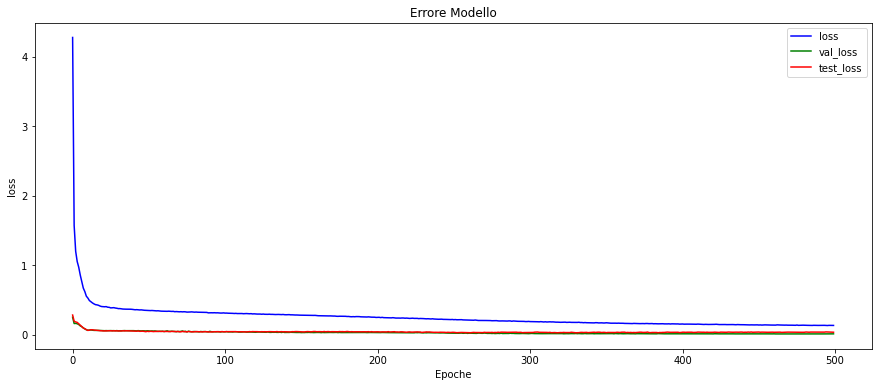

In [81]:
plt.figure(figsize=(15, 6))
plt.plot(history['loss'], color='blue', label='loss')
plt.plot(history['val_loss'], color='green', label='val_loss')
plt.plot(history['test_loss'], color='red', label='test_loss')
plt.title('Errore Modello')
plt.ylabel('loss')
plt.xlabel('Epoche')
plt.legend()
plt.show()

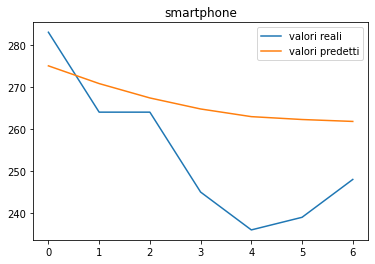

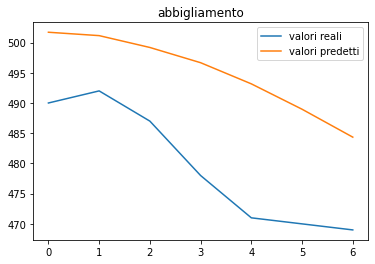

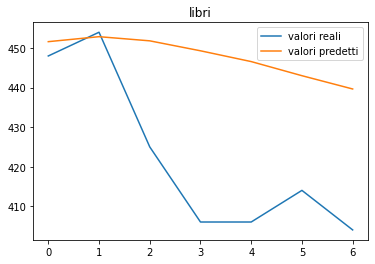

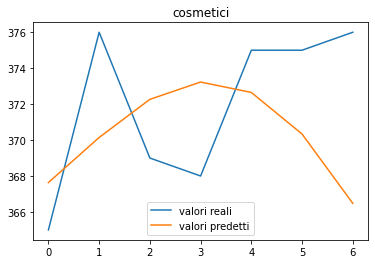

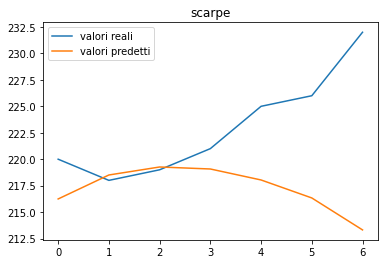

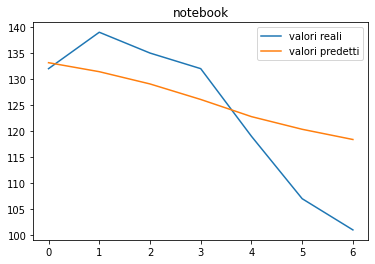

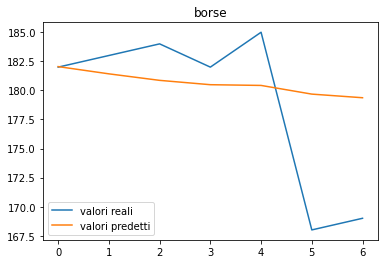

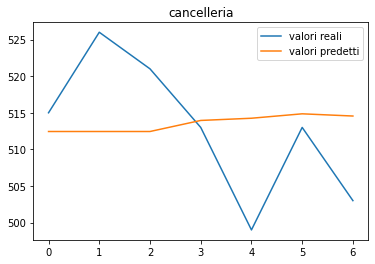

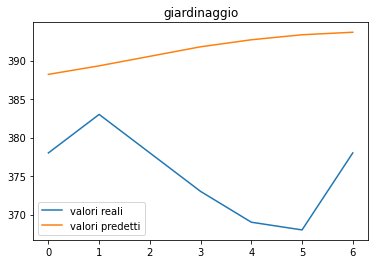

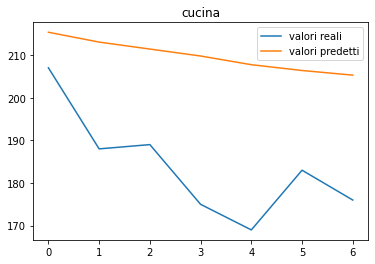

In [82]:
np_output_test_denorm = denormalizza_np(np_output_test_reduced, output_max[:, :, 0], output_min[:, :, 0])
predizioni_denorm = denormalizza_np(predizioni, output_max[:, :, 0], output_min[:, :, 0])

for n, (o, i) in enumerate(zip(np_output_test_denorm, predizioni_denorm)):
    plt.title(indici_categorie[n])
    plt.plot(o, label='valori reali')
    plt.plot(i, label='valori predetti')
    plt.legend()
    plt.show()

### Testiamo il tutto su un periodo più lungo

In [83]:
(
    np_input_train,
    np_output_train,

    np_input_test,
    np_output_test,

    output_max,
    output_min,

    input_max,
    input_min,

    indici_categorie,

) = creazione_dataset(
    df_selected,
    giorni=conf_addestramento['giorni'],
    giorni_addestramento=conf_addestramento['giorni_addestramento'],
    giorni_test=30,
    giorni_validazione=0,  # per avere solo i dati di test
    # non usati durante l'addestramento
    data_iniziale=conf_addestramento['date_inizio']
)



--dataset creati--
Input: (1024, 64, 16)
Output   : (10, 1024, 1)


--dataset creati Validazione e Test-------------------------
Input: (30, 64, 16)
Output   : (10, 30, 1)


----------------------------------------------


### Analizziamo i risultati dell'addestramento

In [84]:
np_output_test_reduced = np_output_test[:, :, 0]  # riduzione dimensionale per facilitare i calcoli

predizioni = model.predict([np_input_test, ])
predizioni = np.asarray(predizioni, dtype=np.float32)

if predizioni.ndim == 3:
    predizioni = predizioni[:, :, 0]
    # riduzione dimensionale per facilitare i calcoli
elif predizioni.ndim == 2:
    predizioni = predizioni.transpose()

errs = np.abs(np_output_test_reduced - predizioni)

errs_mean = np.mean(errs)
errs_max = np.max(errs)
errs_min = np.min(errs)

errs_mean_col = np.mean(errs, axis=1)
errs_max_col = np.max(errs, axis=1)
errs_min_col = np.min(errs, axis=1)

errs_perc = errs / np_output_test_reduced

errs_perc_mean = np.mean(errs_perc)
errs_perc_max = np.max(errs_perc)
errs_perc_min = np.min(errs_perc)

errs_perc_mean_col = np.mean(errs_perc, axis=1)
errs_perc_max_col = np.max(errs_perc, axis=1)
errs_perc_min_col = np.min(errs_perc, axis=1)

for i, (
        err_mean_col,
        err_max_col,
        err_min_col,
        err_perc_mean,
        err_perc_max,
        err_perc_min
) in enumerate(zip(
    errs_mean_col,
    errs_max_col,
    errs_min_col,
    errs_perc_mean_col,
    errs_perc_max_col,
    errs_perc_min_col
)):
    print('\t', "{:<12}".format(i).ljust(2), ' ', str(indici_categorie[i]).ljust(25), '   ',
          '\t', "{:<12}".format("{:.9f}".format(err_perc_mean)),
          '\t', datetime.now().strftime("%H:%M:%S"))

	 0              smartphone                    	 0.109759696  	 22:21:01
	 1              abbigliamento                 	 0.085348129  	 22:21:01
	 2              libri                         	 0.060680427  	 22:21:01
	 3              cosmetici                     	 0.034324452  	 22:21:01
	 4              scarpe                        	 0.146093130  	 22:21:01
	 5              notebook                      	 0.167552009  	 22:21:01
	 6              borse                         	 0.122880444  	 22:21:01
	 7              cancelleria                   	 0.031268913  	 22:21:01
	 8              giardinaggio                  	 0.732341528  	 22:21:01
	 9              cucina                        	 0.275681108  	 22:21:01


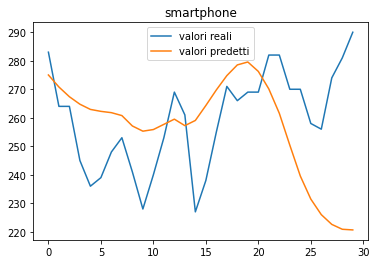

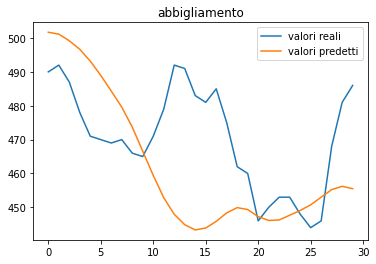

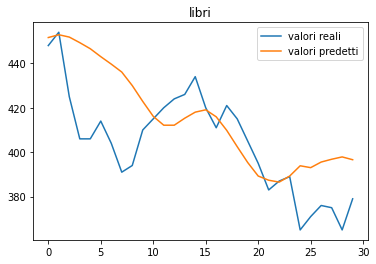

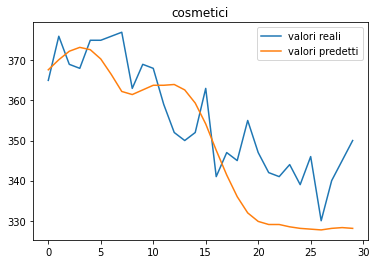

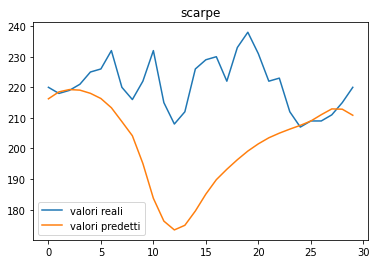

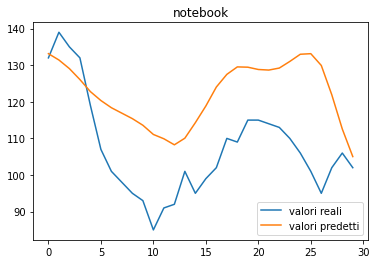

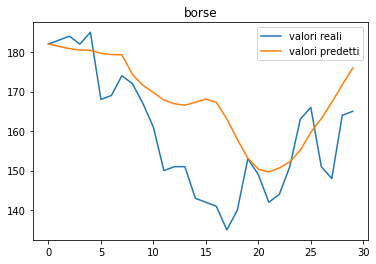

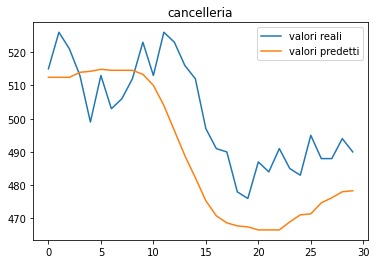

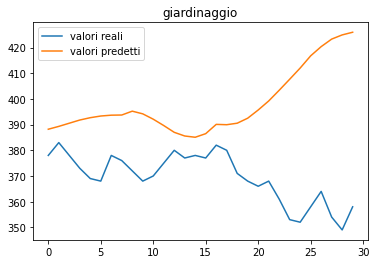

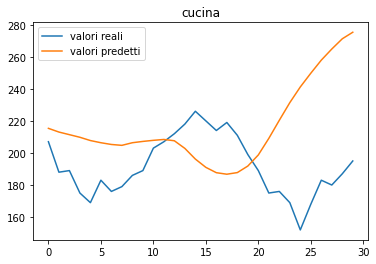

In [85]:
np_output_test_denorm = denormalizza_np(np_output_test_reduced, output_max[:, :, 0], output_min[:, :, 0])
predizioni_denorm = denormalizza_np(predizioni, output_max[:, :, 0], output_min[:, :, 0])

for n, (o, i) in enumerate(zip(np_output_test_denorm, predizioni_denorm)):
    plt.title(indici_categorie[n])
    plt.plot(o, label='valori reali')
    plt.plot(i, label='valori predetti')
    plt.legend()
    plt.show()
